# HOUSING: PRICE PREDICTION

- Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.

- A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia.

- We are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

In [1]:
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import joblib
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error,mean_squared_error
from scipy.stats import zscore
from sklearn.preprocessing import power_transform
from sklearn.preprocessing import OrdinalEncoder
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('housing_train.csv')
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


In [3]:
pd.set_option('display.max_columns', None)
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,BrkFace,31.0,TA,Gd,CBlock,TA,TA,No,BLQ,450,Unf,0,432,882,GasA,TA,Y,SBrkr,900,0,0,900,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1970.0,Unf,1,280,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,4,5,1949,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1126,0,0,1126,0,0,2,0,2,1,Gd,5,Typ,0,NaN,Detchd,2002.0,Fin,2,520,TA,TA,N,0,96,0,0,0,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,NPkVill,Norm,Norm,Twnhs,2Story,6,6,1976,1976,Gable,CompShg,Plywood,Brk Cmn,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,566,Unf,0,289,855,GasA,TA,Y,SBrkr,855,601,0,1456,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1976.0,Unf,2,440,TA,TA,Y,87,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,1Fam,2Story,4,4,1920,1950,Gambrel,CompShg,BrkFace,BrkFace,None,0.0,TA,Fa,BrkTil,TA,TA,No,Unf,0,Unf,0,649,649,Ga

In [4]:
#checking the data dimensions
df.shape

(1168, 81)

In [5]:
#checking the columns in the dataset
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [6]:
pd.set_option('display.max_rows', None)


In [7]:
#checking the datatypes of each column
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


- We can see from the above observation that the columns have 'int', 'float', 'object' datatypes.

In [8]:
#checking the null values in each column of the dataset
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

- From the above stats we can see that 'LotFrontage','Alley','MasVnrType','MasVnrArea','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','FireplaceQu','GarageType','GarageYrBlt','GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature' columns have null values.

In [9]:
df['LotFrontage']=df['LotFrontage'].fillna(df['LotFrontage'].mean())

- I am replacing the nan values with mean as I am considering that houses will be at the mean value of Linear feet of street connected to property.

In [10]:
df['Alley']=df['Alley'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no alleys access to the property.

In [11]:
df['MasVnrType']=df['MasVnrType'].fillna(df['MasVnrType'].mode()[0])

- Replacing the nan values with mode as it is a object column and I am considering that nan column houses have same Masonry veneer type that most houses have.

In [12]:
df['MasVnrArea']=df['MasVnrArea'].fillna(df['MasVnrArea'].mean())

- Replacing the nan values with the mean as I am considering that nan values have mean of the values we have.

In [13]:
df['BsmtQual']=df['BsmtQual'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Basement in the property.

In [14]:
df['BsmtCond']=df['BsmtCond'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Basement in the property.

In [15]:
df['BsmtExposure']=df['BsmtExposure'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Basement in the property.

In [16]:
df['BsmtFinType1']=df['BsmtFinType1'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Basement in the property.

In [17]:
df['BsmtFinType2']=df['BsmtFinType2'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Basement in the property.

In [18]:
df['FireplaceQu']=df['FireplaceQu'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no FirePlace in the property.

In [19]:
df['GarageType']=df['GarageType'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Garage in the property.

In [20]:
df['GarageYrBlt']=df['GarageYrBlt'].replace(np.nan, 0)

- I am replacing the nan values with 0 as I am considering that there is no Garage in the property.

In [21]:
df['GarageFinish']=df['GarageFinish'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Garage in the property.

In [22]:
df['GarageQual']=df['GarageQual'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Garage in the property.

In [23]:
df['GarageCond']=df['GarageCond'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Garage in the property.

In [24]:
df['PoolQC']=df['PoolQC'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Pool in the property.

In [25]:
df['Fence']=df['Fence'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Fence in the property.

In [26]:
df['MiscFeature']=df['MiscFeature'].replace(np.nan, 'NA')

- I am replacing the nan values with NA as I am considering that there is no Miscellaneous features in the property.

### Visualization of the Data

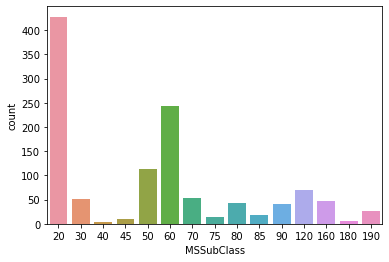

In [27]:
sns.countplot(x='MSSubClass',data=df)
plt.show()

- We can observe that majority of the property have '1-STORY 1946 & NEWER ALL STYLES' dwelling involved in the sale.

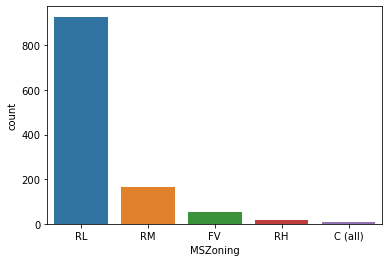

In [28]:
sns.countplot(x='MSZoning',data=df)
plt.show()

- We can observe that majority of the property have 'Residential Low Density'.

<AxesSubplot:xlabel='LotFrontage', ylabel='Density'>

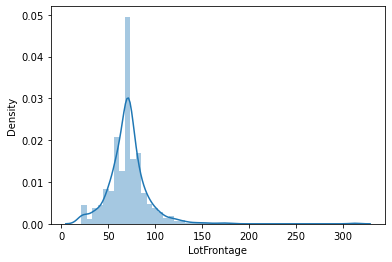

In [29]:
sns.distplot(df["LotFrontage"])

- We can observe that majority of the property have linear feet 50-100 that is connected to the property.

<AxesSubplot:xlabel='LotArea', ylabel='Density'>

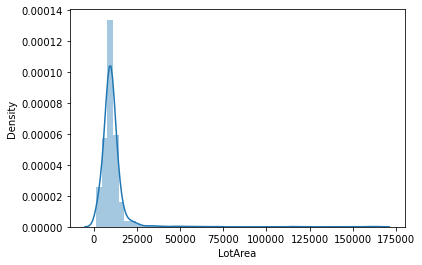

In [30]:
sns.distplot(df["LotArea"])

- We can observe that majority of the property have lot area between 0 to 25000 square feet.

<AxesSubplot:xlabel='MSZoning'>

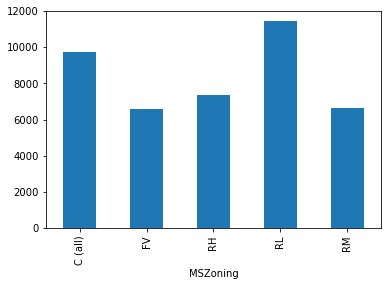

In [31]:
df.groupby('MSZoning')['LotArea'].mean().plot.bar()

- We can see that Residential Low Density zone have more LotArea as compared to other zones. Commercial zone have also a good amount of LotArea.

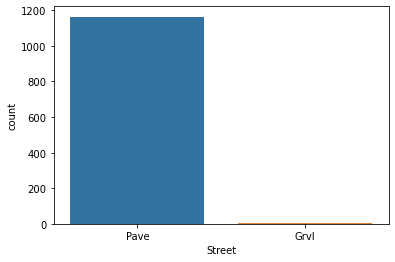

In [32]:
sns.countplot(x='Street',data=df)
plt.show()

-  We can observe from the above graph that maximum number of property have Paved street.

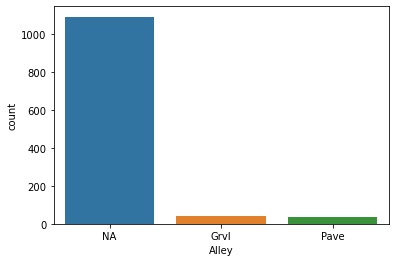

In [33]:
sns.countplot(x='Alley',data=df)
plt.show()

- We can observe that most of the property doesn't have alley access.

<AxesSubplot:xlabel='LotShape'>

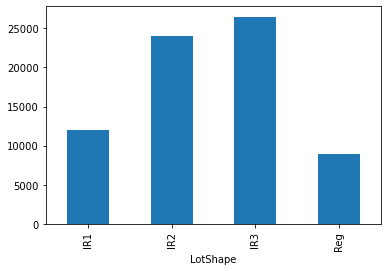

In [34]:
df.groupby('LotShape')['LotArea'].mean().plot.bar()

- We can see that Irregular shape of property have the most LotArea and after that moderately Irregular shape have the most LotArea.

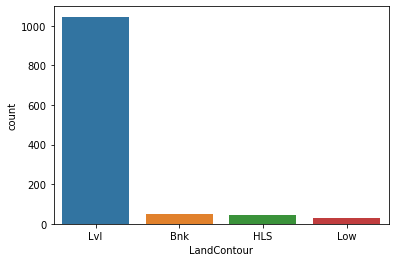

In [35]:
sns.countplot(x='LandContour',data=df)
plt.show()

- We can observe that most of the property are near flat or level.

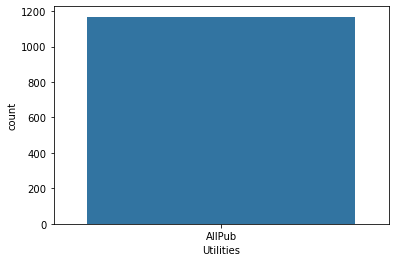

In [36]:
sns.countplot(x='Utilities',data=df)
plt.show()

- We can see that every property have all public utilities.

<AxesSubplot:xlabel='LotConfig'>

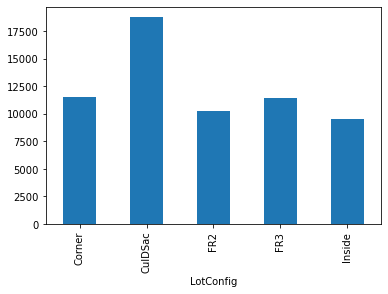

In [37]:
df.groupby('LotConfig')['LotArea'].mean().plot.bar()

- We can observe that cul-de-sac configuration property have the most LotArea.

Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64

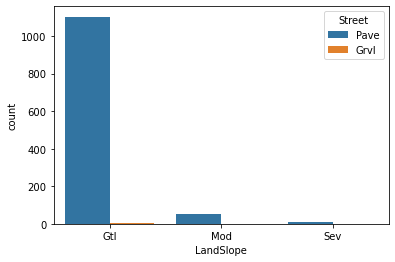

In [38]:
sns.countplot(x="LandSlope", hue="Street", data=df)
df['LandSlope'].value_counts()

- We can observe that most of the property have Gentle slope and most of the street to the property in gentle slope are Paved.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24]),
 [Text(0, 0, 'NPkVill'),
  Text(1, 0, 'NAmes'),
  Text(2, 0, 'NoRidge'),
  Text(3, 0, 'NWAmes'),
  Text(4, 0, 'Gilbert'),
  Text(5, 0, 'Sawyer'),
  Text(6, 0, 'Edwards'),
  Text(7, 0, 'IDOTRR'),
  Text(8, 0, 'CollgCr'),
  Text(9, 0, 'Mitchel'),
  Text(10, 0, 'Crawfor'),
  Text(11, 0, 'BrDale'),
  Text(12, 0, 'StoneBr'),
  Text(13, 0, 'BrkSide'),
  Text(14, 0, 'NridgHt'),
  Text(15, 0, 'OldTown'),
  Text(16, 0, 'Somerst'),
  Text(17, 0, 'Timber'),
  Text(18, 0, 'SWISU'),
  Text(19, 0, 'SawyerW'),
  Text(20, 0, 'ClearCr'),
  Text(21, 0, 'Veenker'),
  Text(22, 0, 'Blmngtn'),
  Text(23, 0, 'MeadowV'),
  Text(24, 0, 'Blueste')])

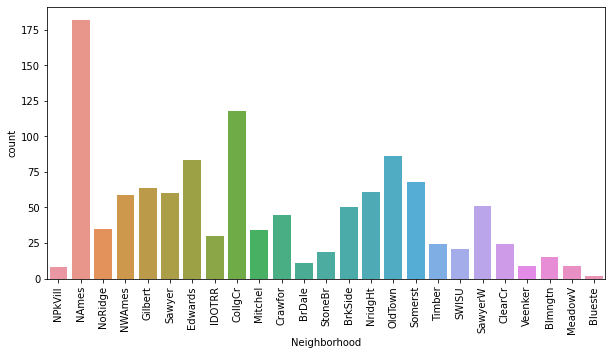

In [39]:
plt.figure(figsize=(10,5))
sns.countplot(df['Neighborhood']) 
plt.xticks(rotation=90)

- We can oberve that most of the property have North Ames Neighborhood.

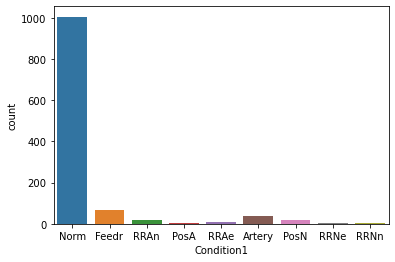

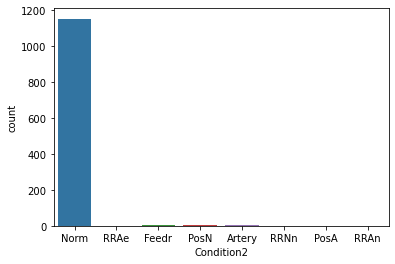

In [40]:
sns.countplot(x='Condition1',data=df)
plt.show()

sns.countplot(x='Condition2',data=df)
plt.show()

- We can observe that the proximity to various conditions are 'Normal'.

1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64

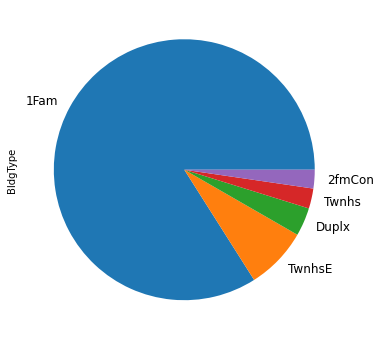

In [41]:
plt.figure(figsize=(10,6))
(df['BldgType'].value_counts()*100 /len(df)).plot.pie(labels = ['1Fam', 'TwnhsE', 'Duplx', 'Twnhs', '2fmCon'],
         fontsize=12)
df['BldgType'].value_counts()

- We can observe that most of the dwelling is Single-family Detached.

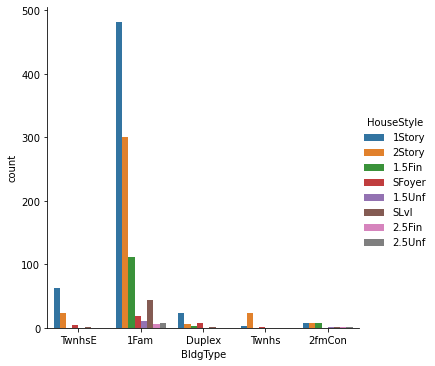

In [42]:
sns.catplot(x ="BldgType", hue ="HouseStyle",  kind ="count", data = df)

- We can observe that in Single-family Detached, Townhouse End Unit, Duplex have majority of One story and in TwnhsI hae majority of Two story and in Two-family Conversion have three style which have same number of values i.e One story,Two story,One and one-half story.

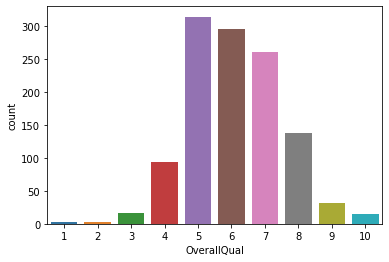

In [43]:
sns.countplot(x='OverallQual',data=df)
plt.show()

- Through the above plot we can observe that most of the overall material and finish of the house are Average, Above Average or Good.

5    640
6    209
7    172
8     61
4     43
3     21
9     16
2      5
1      1
Name: OverallCond, dtype: int64

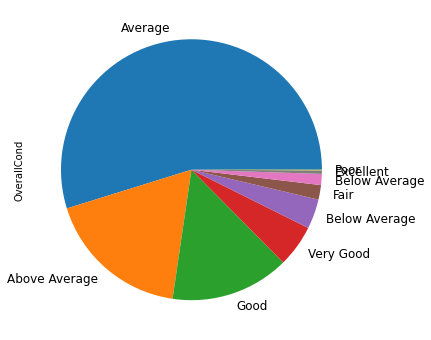

In [44]:
plt.figure(figsize=(10,6))
(df['OverallCond'].value_counts()*100 /len(df)).plot.pie(labels = ['Average', 'Above Average', 'Good', 'Very Good', 'Below Average', 'Fair', 'Below Average', 'Excellent', 'Poor', 'Very Poor'],
         fontsize=12)
df['OverallCond'].value_counts()

- Through the above chart we can observe that most of the overall condition of the house are Average, Above Average or Good.

<AxesSubplot:xlabel='YearBuilt'>

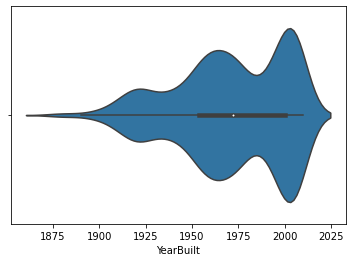

In [45]:
sns.violinplot(x ="YearBuilt", data=df)

- We can observe that majority of the houses are built in the years around 2000.

<AxesSubplot:xlabel='YearRemodAdd'>

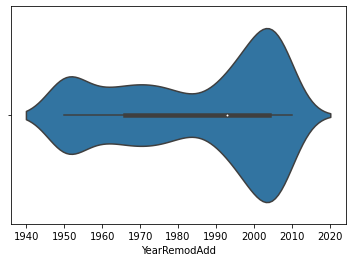

In [46]:
sns.violinplot(x ="YearRemodAdd", data=df)

- Through the above graph we can see that majority of the  remodelling year is around year 2000.

Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64

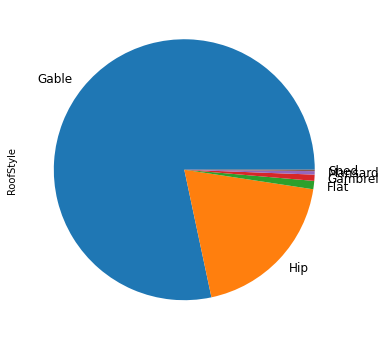

In [47]:
plt.figure(figsize=(10,6))
(df['RoofStyle'].value_counts()*100 /len(df)).plot.pie(labels = ['Gable', 'Hip', 'Flat', 'Gambrel', 'Mansard' ,'Shed'],
         fontsize=12)
df['RoofStyle'].value_counts()

- We can observe that more than 50% of the roof type is Gable.

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'CompShg'),
  Text(1, 0, 'Tar&Grv'),
  Text(2, 0, 'WdShngl'),
  Text(3, 0, 'WdShake'),
  Text(4, 0, 'Roll'),
  Text(5, 0, 'ClyTile'),
  Text(6, 0, 'Metal'),
  Text(7, 0, 'Membran')])

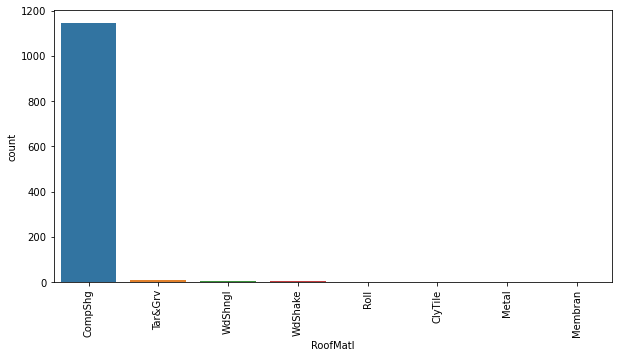

In [48]:
plt.figure(figsize=(10,5))
sns.countplot(df['RoofMatl']) 
plt.xticks(rotation=90)

- We can observe that most of the roof are made up of Standard (Composite) Shingle.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Plywood'),
  Text(1, 0, 'Wd Sdng'),
  Text(2, 0, 'MetalSd'),
  Text(3, 0, 'CmentBd'),
  Text(4, 0, 'VinylSd'),
  Text(5, 0, 'HdBoard'),
  Text(6, 0, 'Wd Shng'),
  Text(7, 0, 'Stucco'),
  Text(8, 0, 'ImStucc'),
  Text(9, 0, 'Stone'),
  Text(10, 0, 'BrkFace'),
  Text(11, 0, 'AsbShng'),
  Text(12, 0, 'Brk Cmn'),
  Text(13, 0, 'AsphShn'),
  Text(14, 0, 'Other')])

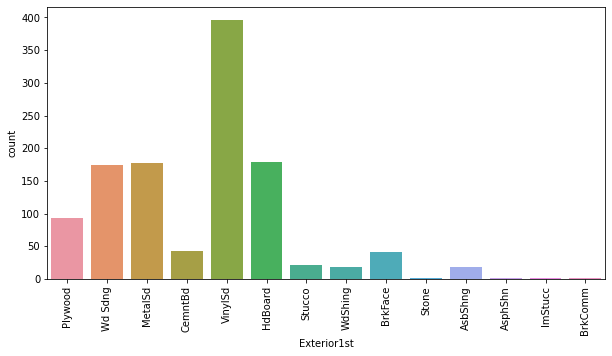

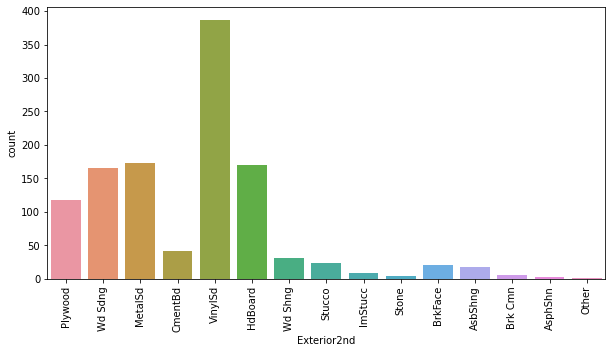

In [49]:
plt.figure(figsize=(10,5))
sns.countplot(df['Exterior1st']) 
plt.xticks(rotation=90)


plt.figure(figsize=(10,5))
sns.countplot(df['Exterior2nd']) 
plt.xticks(rotation=90)

- Through the above 2 graphs we can obsere that Exterior covering of the house are made up of Vinyl Siding

None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64

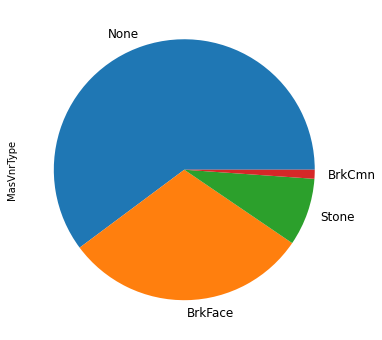

In [50]:
plt.figure(figsize=(10,6))
(df['MasVnrType'].value_counts()*100 /len(df)).plot.pie(labels = ['None', 'BrkFace', 'Stone', 'BrkCmn'],
         fontsize=12)
df['MasVnrType'].value_counts()

- We can observe through the above pie chart that more than 50% of the property doesn't have Masonry veneer.

<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

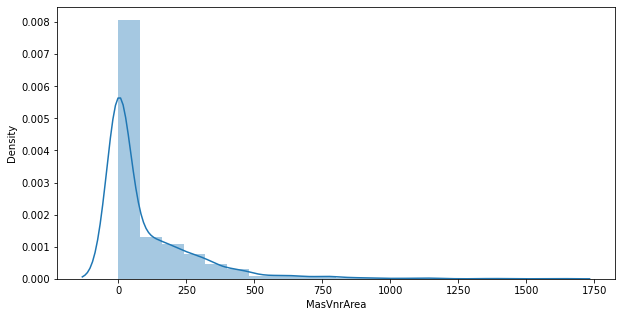

In [51]:
plt.figure(figsize=(10, 5))
sns.distplot(df['MasVnrArea'], bins=20)

- As we know that more than 50% of the property doesn't have the Masonery Veneer area, so the majority area will be 0 but other than that the property that has the Masonery Veneer have majority area below 250 suare feet.

TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64

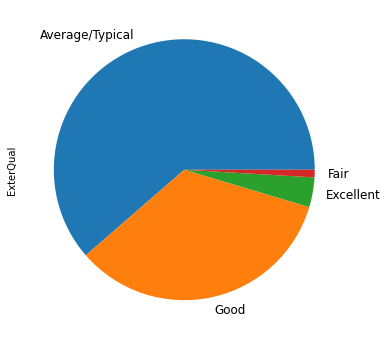

In [52]:
plt.figure(figsize=(10,6))
(df['ExterQual'].value_counts()*100 /len(df)).plot.pie(labels = ['Average/Typical', 'Good', 'Excellent', 'Fair'],
         fontsize=12)
df['ExterQual'].value_counts()

- We can observe that the majority of the quality of the material on the exterior is Average/Typical or Good.

TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64

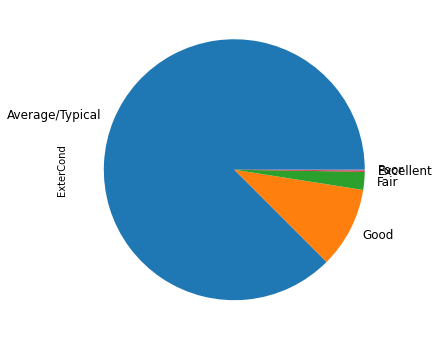

In [53]:
plt.figure(figsize=(10,6))
(df['ExterCond'].value_counts()*100 /len(df)).plot.pie(labels = ['Average/Typical', 'Good', 'Fair', 'Excellent', 'Poor'],
         fontsize=12)
df['ExterCond'].value_counts()

- We can observe that the majority of the present condition of the material on the exterior is Average/Typical.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'CBlock'),
  Text(1, 0, 'PConc'),
  Text(2, 0, 'BrkTil'),
  Text(3, 0, 'Slab'),
  Text(4, 0, 'Stone'),
  Text(5, 0, 'Wood')])

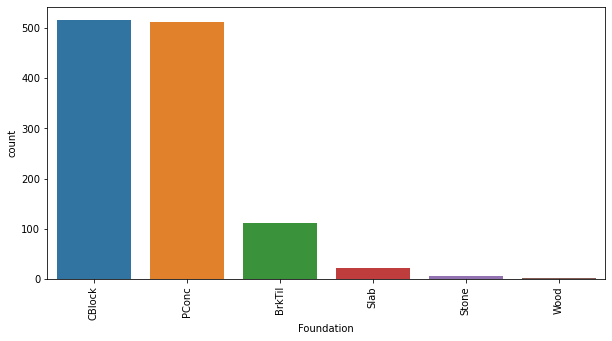

In [54]:
plt.figure(figsize=(10,5))
sns.countplot(df['Foundation']) 
plt.xticks(rotation=90)

- We can see from the above graph that majority of the foundation type are Cinder Block or Poured Contrete.

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Gd'),
  Text(1, 0, 'TA'),
  Text(2, 0, 'Ex'),
  Text(3, 0, 'NA'),
  Text(4, 0, 'Fa')])

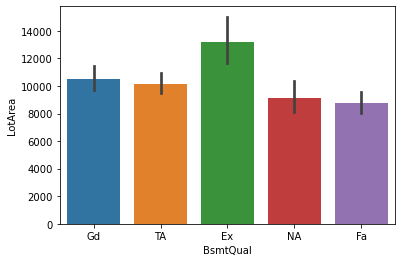

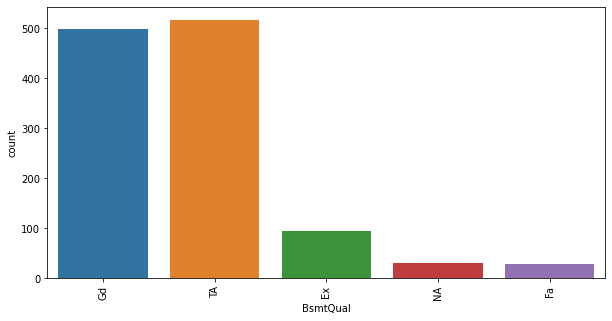

In [55]:
sns.barplot(x='BsmtQual', y='LotArea', data=df)

plt.figure(figsize=(10,5))
sns.countplot(df['BsmtQual']) 
plt.xticks(rotation=90)

- We can observe that the property which have excellent height of the basement have more LotArea.
- We have also see that majority of the properties have Typical (80-89 inches) or Good (90-99 inches) height of the basement.

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'TA'),
  Text(1, 0, 'Gd'),
  Text(2, 0, 'Fa'),
  Text(3, 0, 'NA'),
  Text(4, 0, 'Po')])

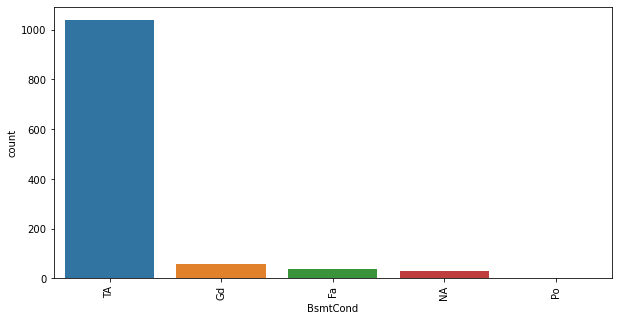

In [56]:
plt.figure(figsize=(10,5))
sns.countplot(df['BsmtCond']) 
plt.xticks(rotation=90)

- Through the above graph we can observe that majority of the basement have 'Typical - slight dampness allowed' condition.

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'No'),
  Text(1, 0, 'Gd'),
  Text(2, 0, 'Av'),
  Text(3, 0, 'Mn'),
  Text(4, 0, 'NA')])

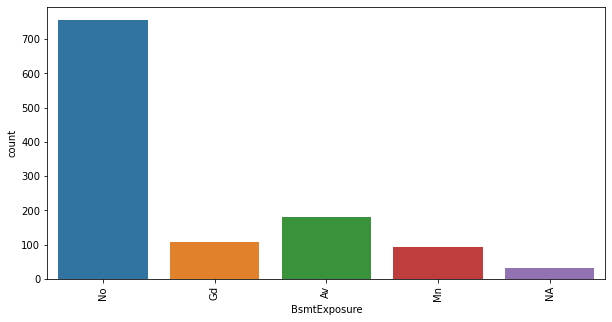

In [57]:
plt.figure(figsize=(10,5))
sns.countplot(df['BsmtExposure']) 
plt.xticks(rotation=90)

- We can observe that majority of the basement have no exposure to the walkout or garden level walls.

<AxesSubplot:xlabel='BsmtFinType1'>

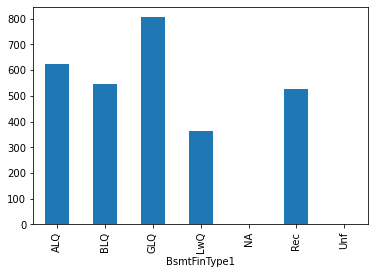

In [58]:
df.groupby('BsmtFinType1')['BsmtFinSF1'].mean().plot.bar()

- Through the above graph we can observe that 'Good Living Quarters' have the highest finished area in square feet.

<AxesSubplot:xlabel='BsmtFinType2'>

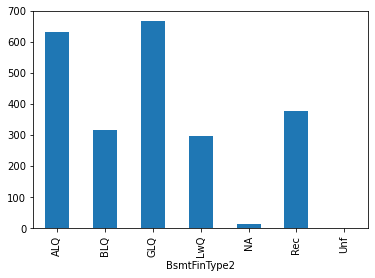

In [59]:
df.groupby('BsmtFinType2')['BsmtFinSF2'].mean().plot.bar()

- Through the above graph we can observe that 'Good Living Quarters' and 'Average Living Quarters' have the highest finished area in square feet.

<AxesSubplot:xlabel='BsmtUnfSF'>

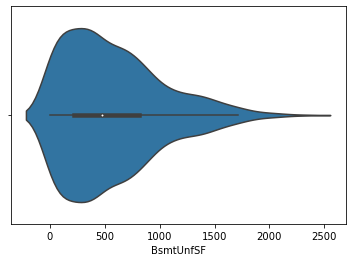

In [60]:
sns.violinplot(x ="BsmtUnfSF", data=df)

- We can observe that most of the basement have unfinished area between 0 to 1000 square feet.

<AxesSubplot:xlabel='TotalBsmtSF'>

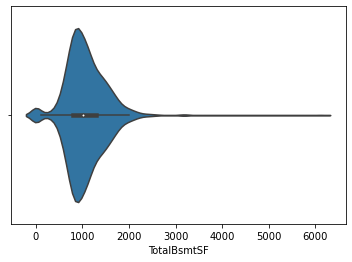

In [61]:
sns.violinplot(x ="TotalBsmtSF", data=df)

- We can observe that total basement area around 1000 square feet in most of the properties.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'GasA'),
  Text(1, 0, 'GasW'),
  Text(2, 0, 'Floor'),
  Text(3, 0, 'OthW'),
  Text(4, 0, 'Wall'),
  Text(5, 0, 'Grav')])

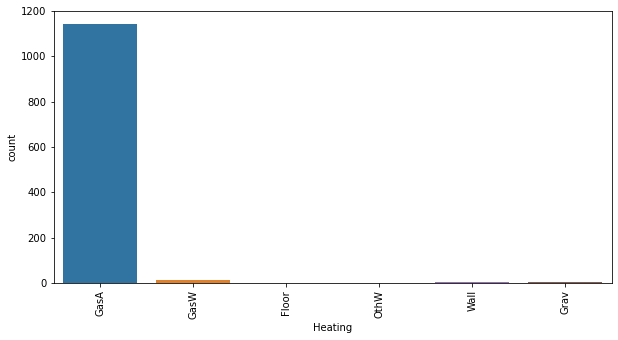

In [62]:
plt.figure(figsize=(10,5))
sns.countplot(df['Heating']) 
plt.xticks(rotation=90)

- We can check that most of the houses have 'Gas forced warm air furnace' heating system.

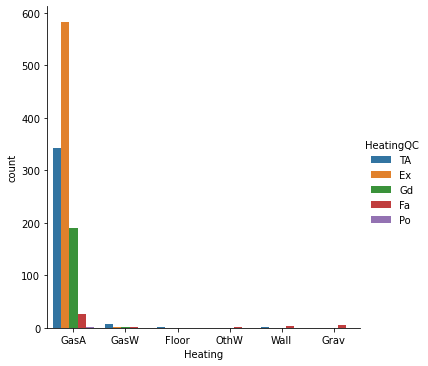

In [63]:
sns.catplot(x ="Heating", hue ="HeatingQC",  kind ="count", data = df)

- We can observe that heating quality of 'Gas forced warm air furnace' is 'Excellent'.

(array([0, 1]), [Text(0, 0, 'Y'), Text(1, 0, 'N')])

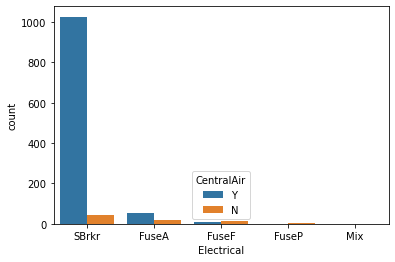

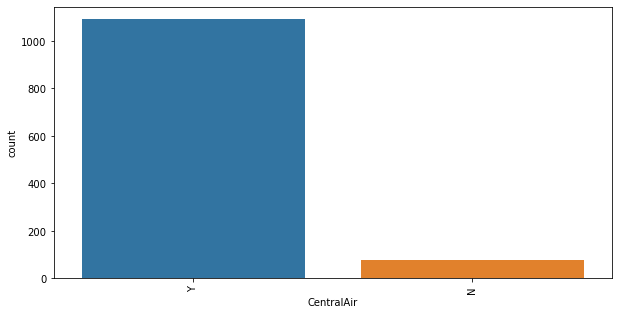

In [64]:
sns.countplot(x="Electrical", hue="CentralAir", data=df)

plt.figure(figsize=(10,5))
sns.countplot(df['CentralAir']) 
plt.xticks(rotation=90)

- We can observe from the above two graphs that majority  of the houses have 'Central air conditioning' and 'Standard Circuit Breakers & Romex'.

<AxesSubplot:xlabel='2ndFlrSF', ylabel='Density'>

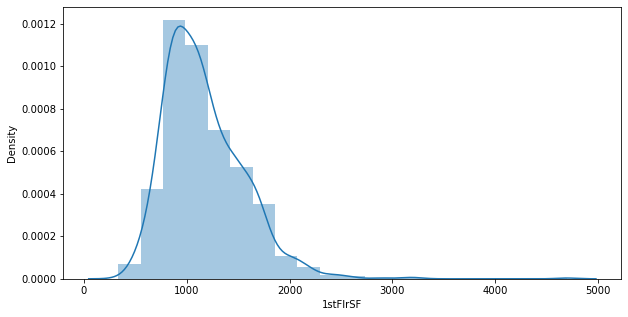

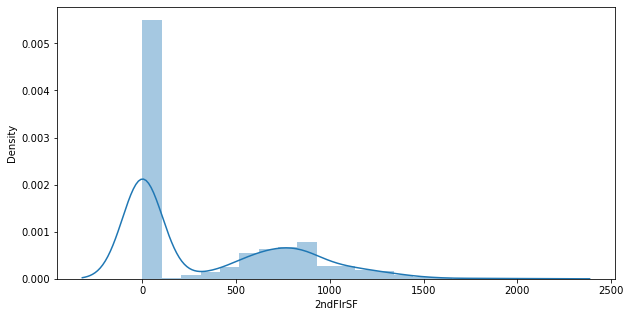

In [65]:
plt.figure(figsize=(10, 5))
sns.distplot(df['1stFlrSF'], bins=20)

plt.figure(figsize=(10, 5))
sns.distplot(df['2ndFlrSF'], bins=20)

- We can observe that in majority of the houses the area of the first floor is between 1000-1500 square feet.
- We can also observe that majority of the houses doesn't have second floorand those have the second floor have the area around 1000 square feet.

<AxesSubplot:xlabel='LowQualFinSF'>

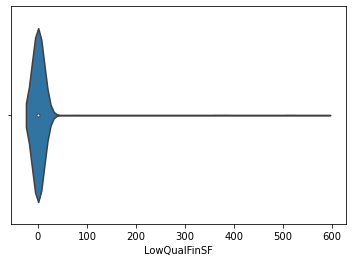

In [66]:
sns.violinplot(x ="LowQualFinSF", data=df)

- We can observe that all of the  properties have nearly 0 Low quality finished square feet.

<AxesSubplot:xlabel='GrLivArea'>

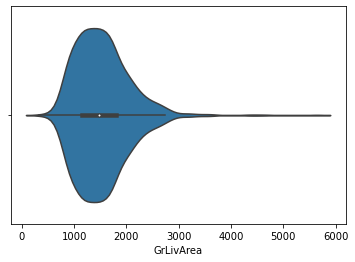

In [67]:
sns.violinplot(x ="GrLivArea", data=df)

- Through the above plot we can observe that houses have Above grade (ground) living area around 1000-2000 square feet.

(array([0, 1, 2]), [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')])

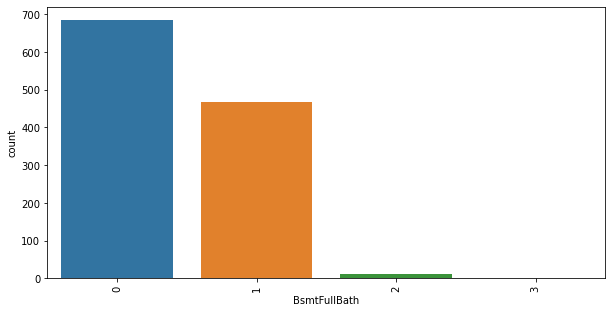

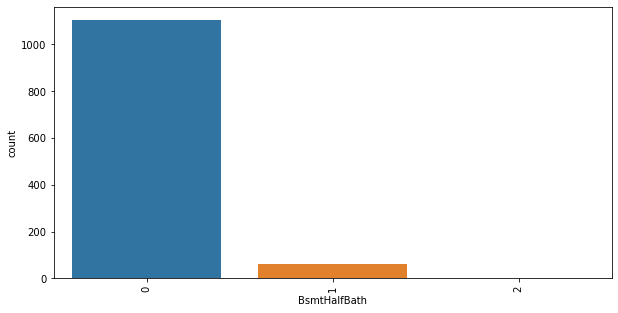

In [68]:
plt.figure(figsize=(10,5))
sns.countplot(df['BsmtFullBath']) 
plt.xticks(rotation=90)


plt.figure(figsize=(10,5))
sns.countplot(df['BsmtHalfBath']) 
plt.xticks(rotation=90)

- Through the above graph we can check that majority of the properties doesn't have bathrooms in the basement whether it is half bathroom or full bathroom. Some houses have 1 full bathroom and 1 half bathroom.

2    610
1    524
3     27
0      7
Name: FullBath, dtype: int64

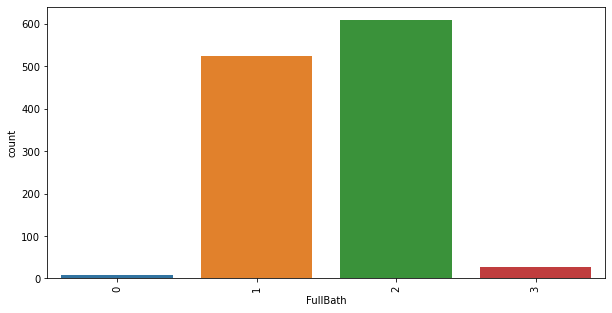

In [69]:
plt.figure(figsize=(10,5))
sns.countplot(df['FullBath']) 
plt.xticks(rotation=90)
df['FullBath'].value_counts()



0    724
1    434
2     10
Name: HalfBath, dtype: int64

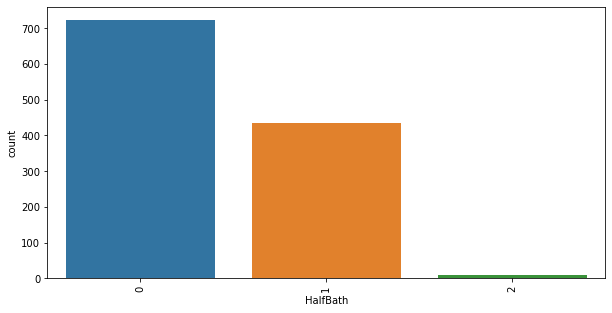

In [70]:
plt.figure(figsize=(10,5))
sns.countplot(df['HalfBath']) 
plt.xticks(rotation=90)
df['HalfBath'].value_counts()

- Through the above 2 graphs we can observe that majority of the houses have 1 or 2 'Full bathrooms above grade' and nearly 0 or 1 'Half Bathrooms'

3    640
2    281
4    180
1     39
5     18
6      5
0      4
8      1
Name: BedroomAbvGr, dtype: int64

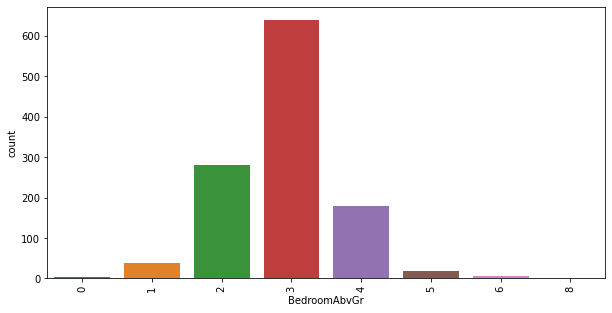

In [71]:
plt.figure(figsize=(10,5))
sns.countplot(df['BedroomAbvGr']) 
plt.xticks(rotation=90)
df['BedroomAbvGr'].value_counts()

- We can observe that majority of the properties have 3 bedrooms, some have 2 or 4 bedrooms.

<AxesSubplot:xlabel='KitchenQual', ylabel='KitchenAbvGr'>

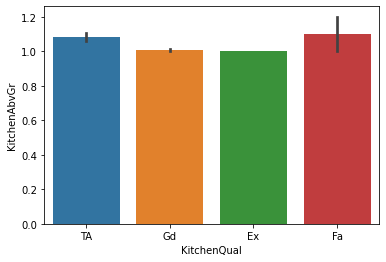

In [72]:
sns.barplot(x='KitchenQual', y='KitchenAbvGr', data=df)

(array([0, 1, 2, 3]),
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

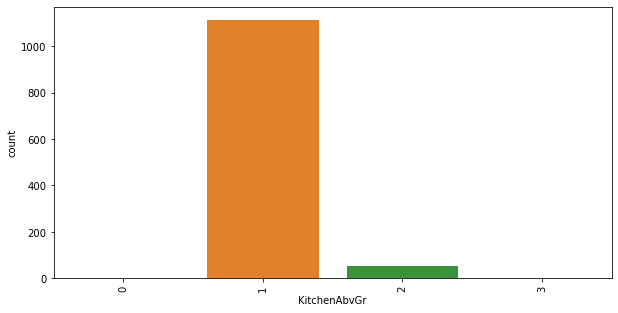

In [73]:
plt.figure(figsize=(10,5))
sns.countplot(df['KitchenAbvGr']) 
plt.xticks(rotation=90)

- We can observe that most of the properties have 1 Kitchens above grade.

(array([0, 1, 2, 3]),
 [Text(0, 0, 'TA'), Text(1, 0, 'Gd'), Text(2, 0, 'Ex'), Text(3, 0, 'Fa')])

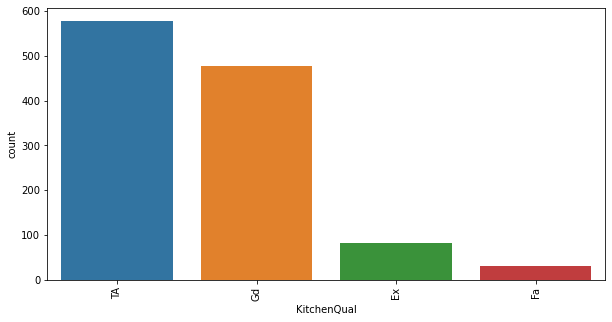

In [74]:
plt.figure(figsize=(10,5))
sns.countplot(df['KitchenQual']) 
plt.xticks(rotation=90)

- We can see that majority of the kitchens have 'Typical/Average' or 'Good' quality.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, '2'),
  Text(1, 0, '3'),
  Text(2, 0, '4'),
  Text(3, 0, '5'),
  Text(4, 0, '6'),
  Text(5, 0, '7'),
  Text(6, 0, '8'),
  Text(7, 0, '9'),
  Text(8, 0, '10'),
  Text(9, 0, '11'),
  Text(10, 0, '12'),
  Text(11, 0, '14')])

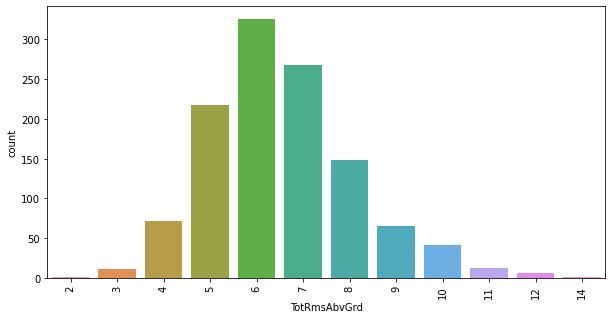

In [75]:
plt.figure(figsize=(10,5))
sns.countplot(df['TotRmsAbvGrd']) 
plt.xticks(rotation=90)

- We can observe that majority of the houses have 5,6 or 7 rooms(does not include bathrooms).

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Typ'),
  Text(1, 0, 'Mod'),
  Text(2, 0, 'Maj1'),
  Text(3, 0, 'Min1'),
  Text(4, 0, 'Min2'),
  Text(5, 0, 'Sev'),
  Text(6, 0, 'Maj2')])

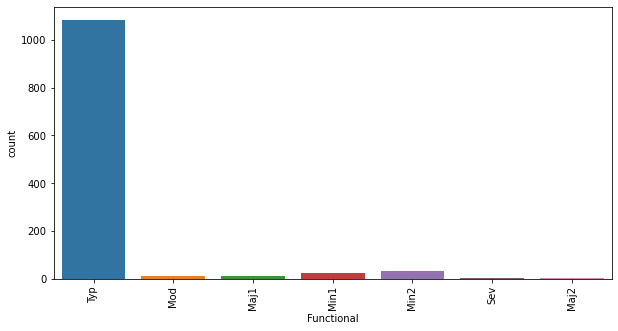

In [76]:
plt.figure(figsize=(10,5))
sns.countplot(df['Functional']) 
plt.xticks(rotation=90)

- Through the above graph we can observe that most of the houses have Typical Functionality.

0    551
1    518
2     94
3      5
Name: Fireplaces, dtype: int64

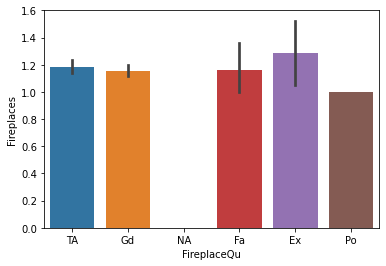

In [77]:
sns.barplot(x='FireplaceQu', y='Fireplaces', data=df)
df['Fireplaces'].value_counts()

- Thorugh the above graph we can observe that most of the places doesn't have fireplaces or have 1 fireplace. The houses that have the fireplaces, majority of them have excellent quality. 

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Attchd'),
  Text(1, 0, 'BuiltIn'),
  Text(2, 0, 'Detchd'),
  Text(3, 0, 'Basment'),
  Text(4, 0, 'NA'),
  Text(5, 0, '2Types'),
  Text(6, 0, 'CarPort')])

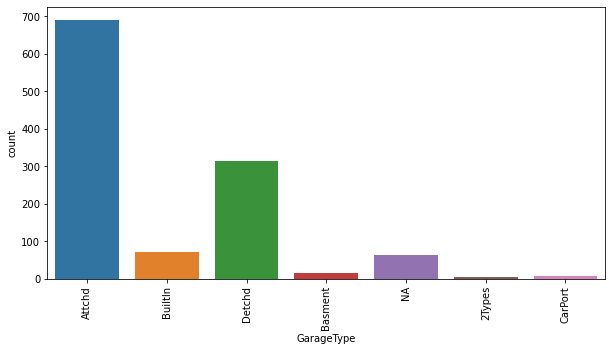

In [78]:
plt.figure(figsize=(10,5))
sns.countplot(df['GarageType']) 
plt.xticks(rotation=90)

- We can observe that majority of the houses have Attached to home Garage.

<AxesSubplot:xlabel='GarageYrBlt'>

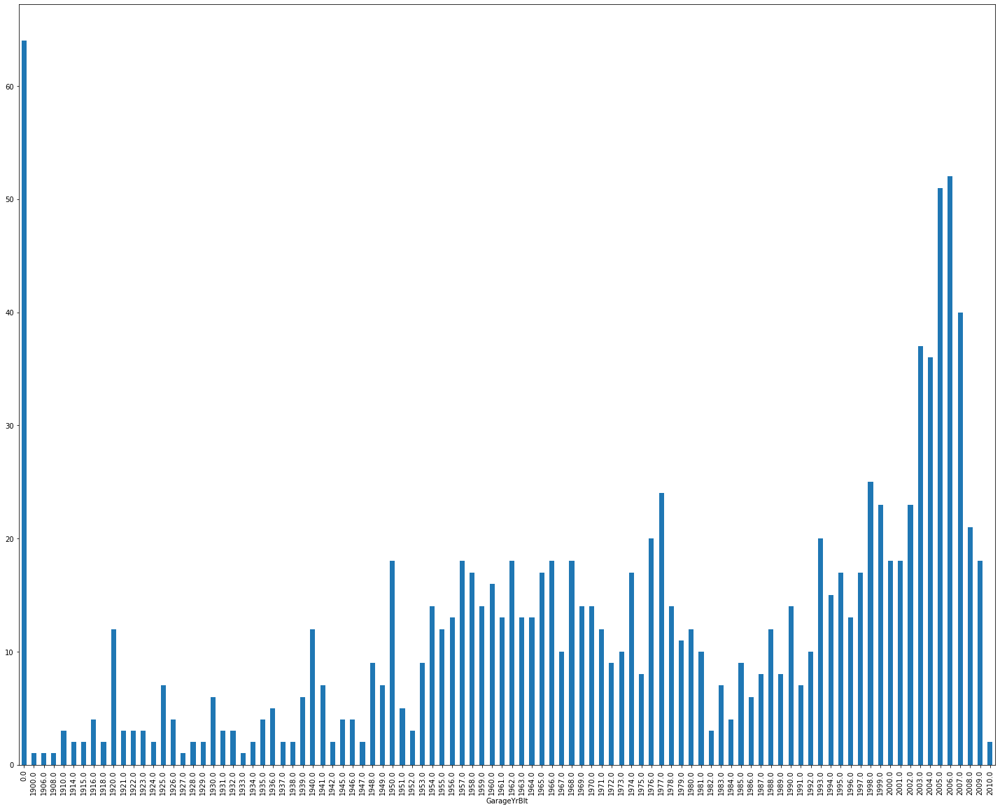

In [79]:
plt.figure(figsize=(25,20))
df.groupby('GarageYrBlt').GarageYrBlt.count().plot.bar()

- We can observe that majority of the houses doesn't have the Garage and those properties that have the garage majority of them built in 2005 and 2006.

Unf    487
RFn    339
Fin    278
NA      64
Name: GarageFinish, dtype: int64

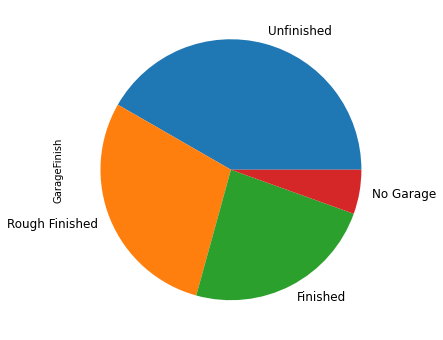

In [80]:
plt.figure(figsize=(10,6))
(df['GarageFinish'].value_counts()*100 /len(df)).plot.pie(labels = ['Unfinished', 'Rough Finished', 'Finished', 'No Garage'],
         fontsize=12)
df['GarageFinish'].value_counts()

- we can observe that most of the garages are unfinished or roughly finished. 

<AxesSubplot:xlabel='GarageCars'>

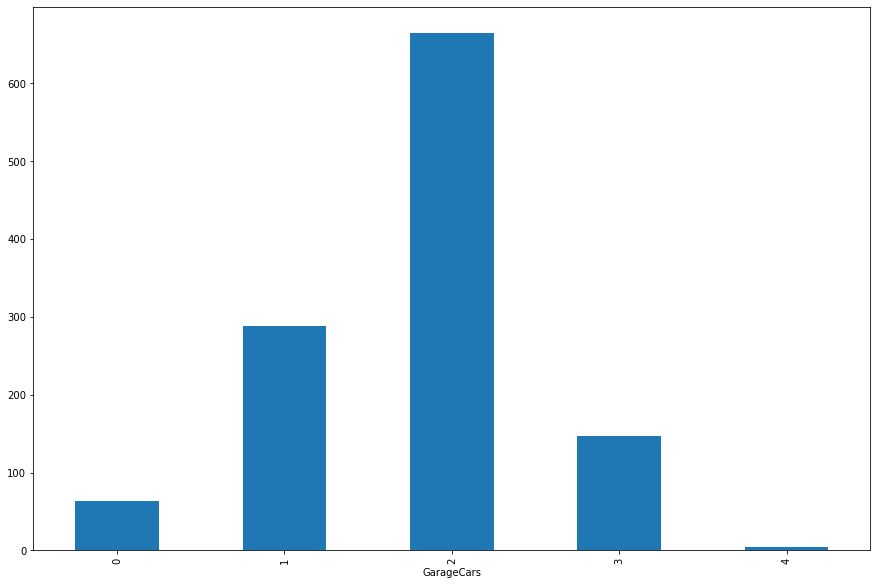

In [81]:
plt.figure(figsize=(15,10))
df.groupby('GarageCars').GarageCars.count().plot.bar()

- Through the above graph we can see that most of the garages have capacity of 1 or 2 cars.

<AxesSubplot:xlabel='GarageArea', ylabel='Density'>

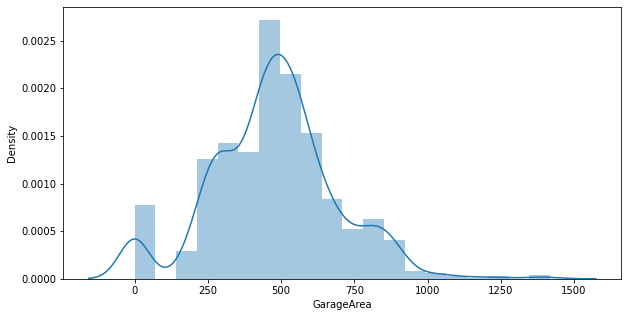

In [82]:
plt.figure(figsize=(10, 5))
sns.distplot(df['GarageArea'], bins=20)

- We can observe that the area of most of the garages are around 500 square feet.

TA    1050
NA      64
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64

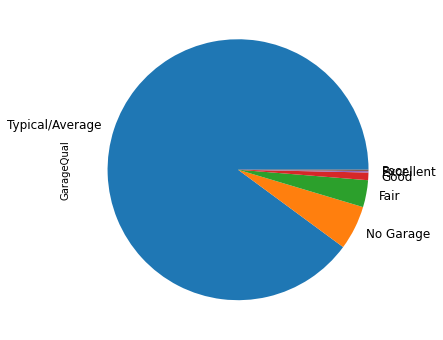

In [83]:
plt.figure(figsize=(10,6))
(df['GarageQual'].value_counts()*100 /len(df)).plot.pie(labels = ['Typical/Average', 'No Garage', 'Fair', 'Good', 'Excellent', 'Poor'],
         fontsize=12)
df['GarageQual'].value_counts()

- We can see that most of the garage quality are Typical/Average.

TA    1061
NA      64
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64

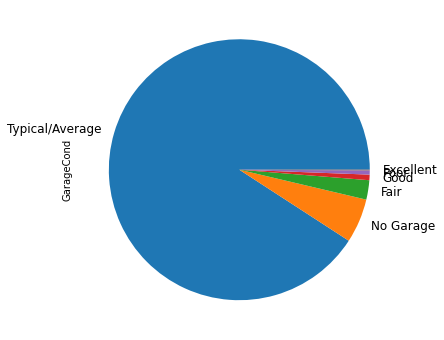

In [84]:
plt.figure(figsize=(10,6))
(df['GarageCond'].value_counts()*100 /len(df)).plot.pie(labels = ['Typical/Average', 'No Garage', 'Fair', 'Good', 'Poor', 'Excellent'],
         fontsize=12)
df['GarageCond'].value_counts()

- We can see that most of the garage condition are Typical/Average.

Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64

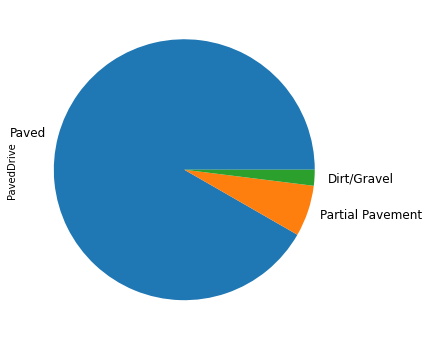

In [85]:
plt.figure(figsize=(10,6))
(df['PavedDrive'].value_counts()*100 /len(df)).plot.pie(labels = ['Paved', 'Partial Pavement', 'Dirt/Gravel'],
         fontsize=12)
df['PavedDrive'].value_counts()

- We can observe from the above pie chart that most of the driveway are Paved

<AxesSubplot:xlabel='WoodDeckSF', ylabel='Density'>

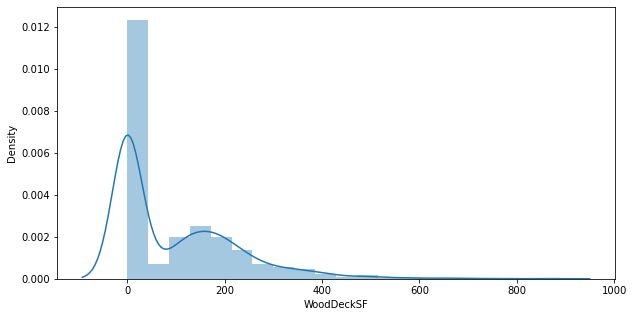

In [86]:
plt.figure(figsize=(10, 5))
sns.distplot(df['WoodDeckSF'], bins=20)

- We can see that most of the properties doesn't have Wood deck area and those houses that have Wood deck have area around 200 square feet.

<AxesSubplot:xlabel='OpenPorchSF', ylabel='Density'>

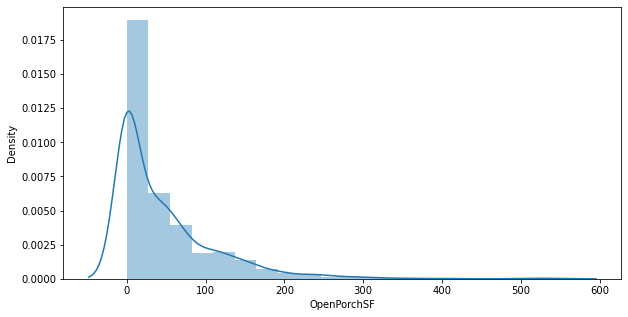

In [87]:
plt.figure(figsize=(10, 5))
sns.distplot(df['OpenPorchSF'], bins=20)

- We can see that most of the properties doesn't have Open porch area and those houses that have Open porch have area around 50-100 square feet.

<AxesSubplot:xlabel='EnclosedPorch', ylabel='Density'>

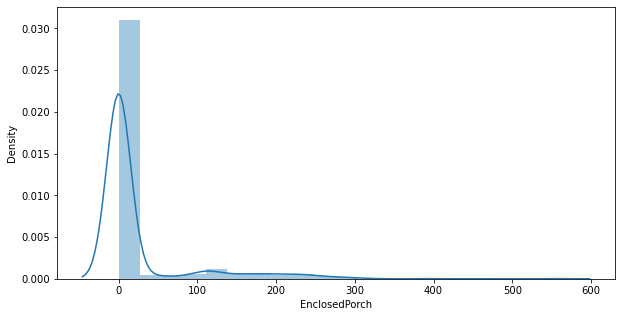

In [88]:
plt.figure(figsize=(10, 5))
sns.distplot(df['EnclosedPorch'], bins=20)

- We can see that most of the properties doesn't have Enclosed porch area

<AxesSubplot:xlabel='3SsnPorch', ylabel='Density'>

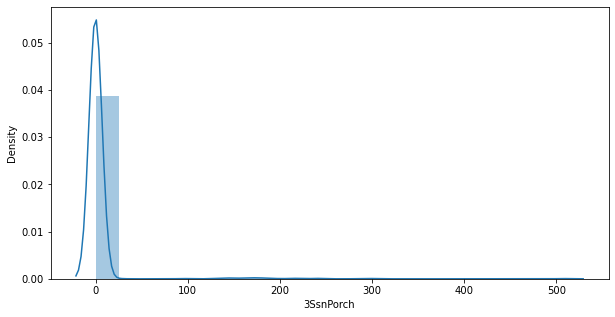

In [89]:
plt.figure(figsize=(10, 5))
sns.distplot(df['3SsnPorch'], bins=20)

- We can see that most of the properties doesn't have Three season porch area.

<AxesSubplot:xlabel='ScreenPorch', ylabel='Density'>

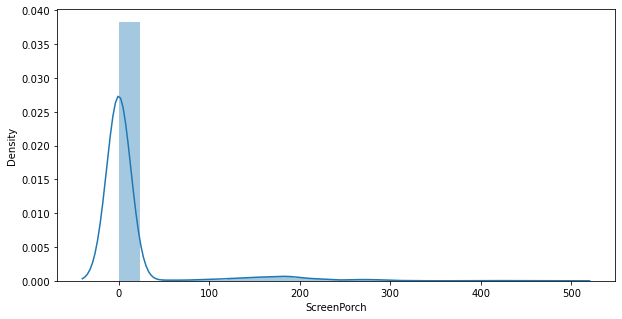

In [90]:
plt.figure(figsize=(10, 5))
sns.distplot(df['ScreenPorch'], bins=20)

- We can see that most of the properties doesn't have Screen porch area.

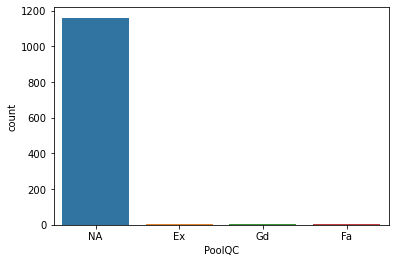

<AxesSubplot:xlabel='PoolArea', ylabel='Density'>

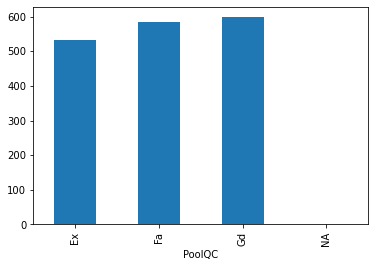

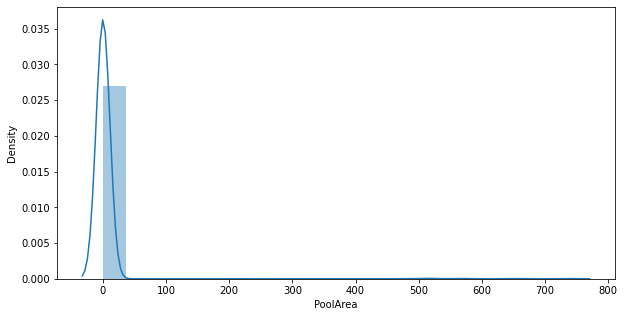

In [91]:
sns.countplot(x='PoolQC',data=df)
plt.show()


df.groupby('PoolQC')['PoolArea'].mean().plot.bar()

plt.figure(figsize=(10, 5))
sns.distplot(df['PoolArea'], bins=20)

- We can observe that most of the houses doesn't have pool, so the quality cannot be defined.

NA       931
MnPrv    129
GdPrv     51
GdWo      47
MnWw      10
Name: Fence, dtype: int64

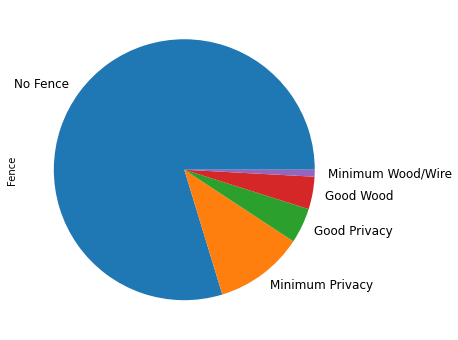

In [92]:
plt.figure(figsize=(10,6))
(df['Fence'].value_counts()*100 /len(df)).plot.pie(labels = ['No Fence', 'Minimum Privacy', 'Good Privacy', 'Good Wood', 'Minimum Wood/Wire'],
         fontsize=12)
df['Fence'].value_counts()

- We can observe that more than 75% houses doesn't have the fence.

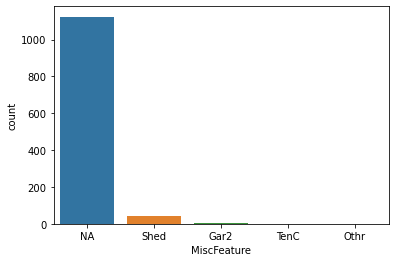

In [93]:
sns.countplot(x='MiscFeature',data=df)
plt.show()

- We can observe from the above plot that most of the houses doen't have any Miscellaneous feature.

<AxesSubplot:xlabel='MiscVal'>

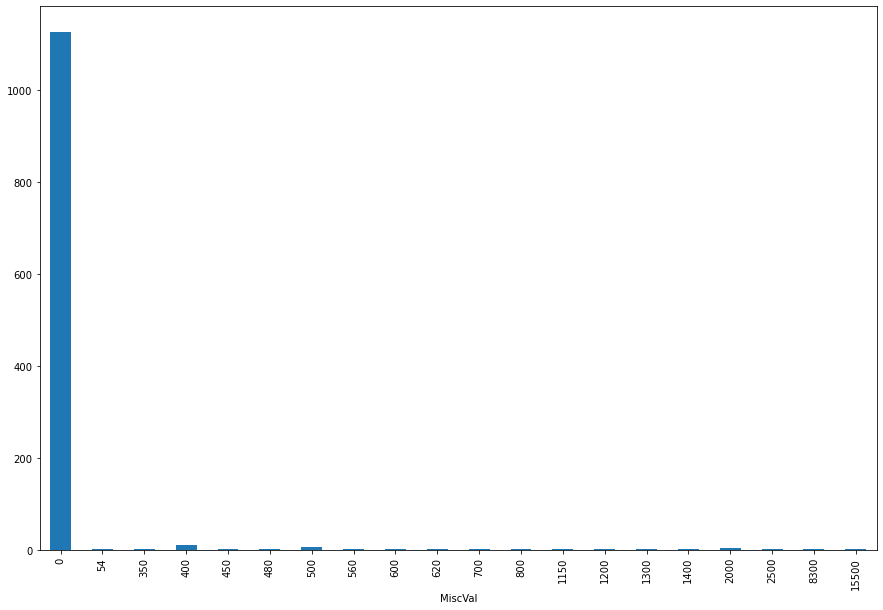

In [94]:
plt.figure(figsize=(15,10))
df.groupby('MiscVal').MiscVal.count().plot.bar()

- As we know most of the houses doesn't have Miscellaneous feature, so most of the values will be 0.

<AxesSubplot:xlabel='MoSold'>

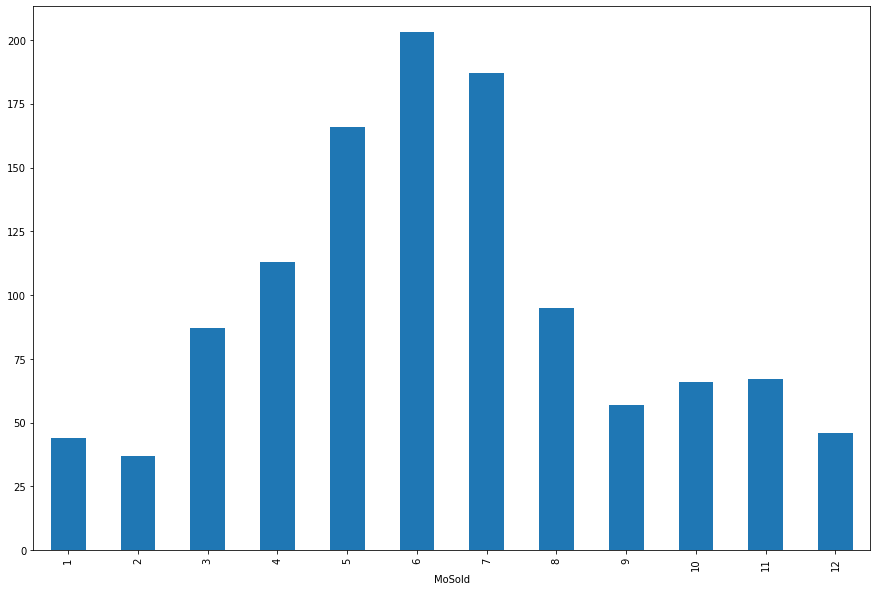

In [95]:
plt.figure(figsize=(15,10))
df.groupby('MoSold').MoSold.count().plot.bar()

- We can observe that most of the houses have been sold in 5,6 and 7 month.

<AxesSubplot:xlabel='YrSold'>

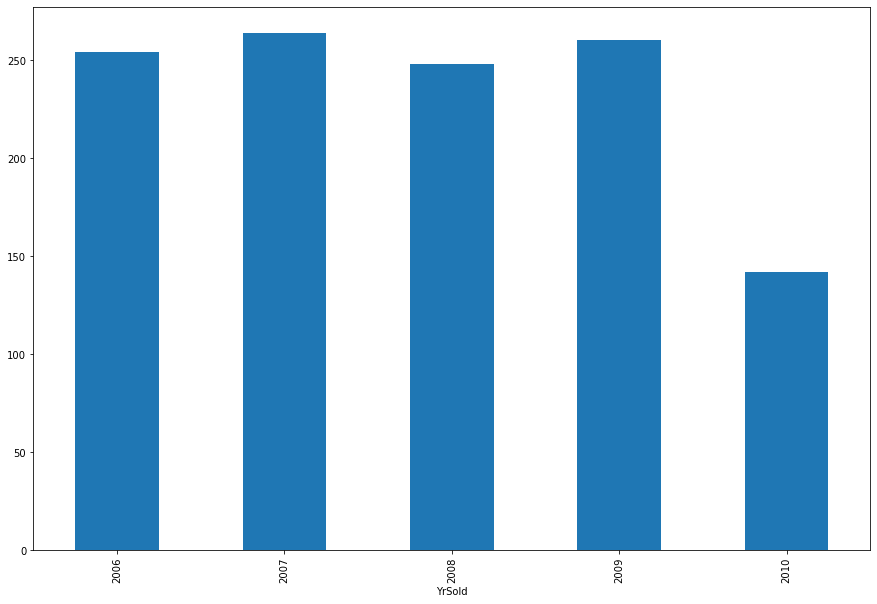

In [96]:
plt.figure(figsize=(15,10))
df.groupby('YrSold').YrSold.count().plot.bar()

- We can observe that the houses have been sold moderately in year 2006, 2007, 2008 and 2009.

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'WD'),
  Text(1, 0, 'COD'),
  Text(2, 0, 'New'),
  Text(3, 0, 'ConLI'),
  Text(4, 0, 'ConLw'),
  Text(5, 0, 'Con'),
  Text(6, 0, 'ConLD'),
  Text(7, 0, 'Oth'),
  Text(8, 0, 'CWD')])

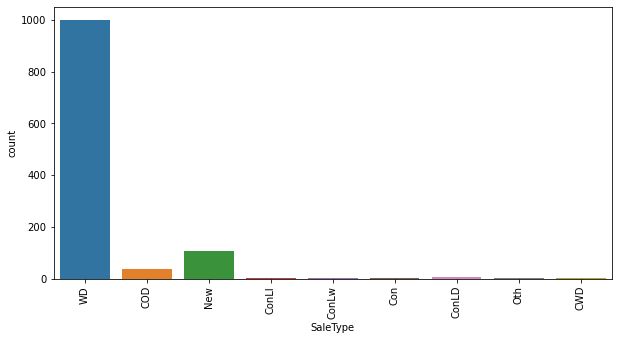

In [97]:
plt.figure(figsize=(10,5))
sns.countplot(df['SaleType']) 
plt.xticks(rotation=90)

- We can see that most of the sales are Warranty Deed - Conventional.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Normal'),
  Text(1, 0, 'Partial'),
  Text(2, 0, 'Abnorml'),
  Text(3, 0, 'Family'),
  Text(4, 0, 'Alloca'),
  Text(5, 0, 'AdjLand')])

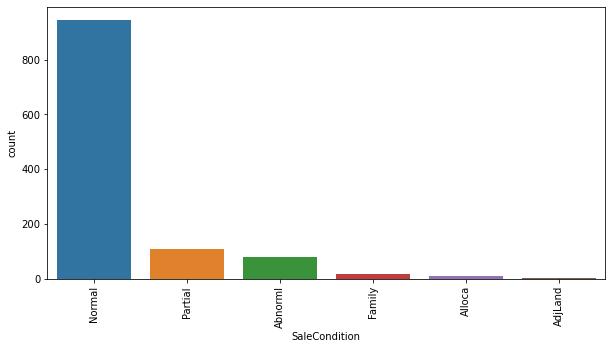

In [98]:
plt.figure(figsize=(10,5))
sns.countplot(df['SaleCondition']) 
plt.xticks(rotation=90)

- We can observe that most of the sales are Normal sale.

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

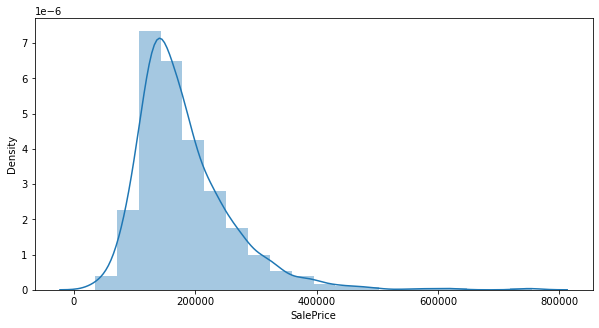

In [99]:
plt.figure(figsize=(10, 5))
sns.distplot(df['SalePrice'], bins=20)

- We can observe that most of the houses have price around 200000 dollars.

In [100]:
sns.pairplot(df)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x07F3E850> (for post_execute):


KeyboardInterrupt: 

In [ ]:
# Histogram to see the data distribution of all the columns
df.hist(figsize=(20,20), grid = True, layout = (8,10), bins = 30)

In [ ]:
df.plot(kind='density',subplots=True,  layout=(10,8), sharex=False, legend=False, fontsize=1, figsize=(10,12))
plt.show()

In [ ]:
# Let's see the correlation between different columns.
corr_df= df.corr()

plt.figure(figsize=[22,12])
sns.heatmap(corr_df,cmap="cividis",annot=True)
plt.title('correlation between different columns')
plt.show()

In [ ]:
#defining corr between every column to the target column

corr_matrix=df.corr()
corr_matrix['SalePrice'].sort_values(ascending=False)

- We can observe that OverallQual is the most positively correlated aspect to the SalePrice. We can also observe that KitchenAbvGr is the most negatively correlated aspect to the SalePrice.

### Data pre-processing

In [101]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.988470,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,46.647260,569.721747,1061.095034,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1869.799658,1.776541,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,22.437056,8957.442311,1.390153,1.124343,30.145255,20.785185,182.047152,462.664785,163.520016,449.375525,442.272249,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,451.037303,0.745554,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1957.750000,1.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.988470,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,1096.500000,0.000000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1977.000000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,79.250000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,1392.000000,729.000000,0.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [102]:
enc=OrdinalEncoder()

for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))

In [103]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3.0,70.98847,4928,1.0,1.0,0.0,3.0,0.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1976,1976,1.0,1.0,8.0,9.0,2.0,0.000000,3.0,4.0,1.0,2.0,4.0,4.0,0.0,120,6.0,0,958,1078,1.0,4.0,1.0,4.0,958,0,0,958,0,0,2,0,2,1,3.0,5,6.0,1,5.0,1.0,1977.0,2.0,2,440,5.0,5.0,2.0,0,205,0,0,0,0,3.0,4.0,1.0,0,2,2007,8.0,4.0,128000
1,889,20,3.0,95.00000,15865,1.0,1.0,0.0,3.0,0.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,1970,1970,0.0,5.0,12.0,13.0,2.0,0.000000,2.0,2.0,2.0,4.0,1.0,1.0,0.0,351,5.0,823,1043,2217,1.0,0.0,1.0,4.0,2217,0,0,2217,1,0,2,0,4,1,2.0,8,6.0,1,5.0,1.0,1970.0,3.0,2,621,5.0,5.0,2.0,81,207,0,0,224,0,3.0,4.0,1.0,0,10,2007,8.0,4.0,268000
2,793,60,3.0,92.00000,9920,1.0,1.0,0.0,3.0,0.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1996,1997,1.0,1.0,7.0,7.0,2.0,0.000000,2.0,4.0,2.0,2.0,4.0,0.0,2.0,862,6.0,0,255,1117,1.0,0.0,1.0,4.0,1127,886,0,2013,1,0,2,1,3,1,3.0,8,6.0,1,5.0,1.0,1997.0,3.0,2,455,5.0,5.0,2.0,180,130,0,0,0,0,3.0,4.0,1.0,0,6,2007,8.0,4.0,269790
3,110,20,3.0,105.00000,11751,1.0,1.0,0.0,3.0,0.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,1977,1977,3.0,1.0,8.0,9.0,1.0,480.000000,3.0,4.0,1.0,2.0,4.0,4.0,1.0,705,6.0,0,1139,1844,1.0,0.0,1.0,4.0,1844,0,0,1844,0,0,2,0,3,1,3.0,7,6.0,1,5.0,1.0,1977.0,2.0,2,546,5.0,5.0,2.0,0,122,0,0,0,0,3.0,2.0,1.0,0,1,2010,0.0,4.0,190000
4,422,20,3.0,70.98847,16635,1.0,1.0,0.0,3.0,0.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,1977,2000,1.0,1.0,4.0,4.0,3.0,126.000000,2.0,4.0,1.0,2.0,4.0,4.0,0.0,1246,6.0,0,356,1602,1.0,2.0,1.0,4.0,1602,0,0,1602,0,1,2,0,3,1,2.0,8,6.0,1,5.0,1.0,1977.0,0.0,2,529,5.0,5.0,2.0,240,0,0,0,0,0,3.0,4.0,1.0,0,6,2009,8.0,4.0,215000
5,1197,60,3.0,58.00000,14054,1.0,1.0,0.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,0.0,5.0,7,5,2006,2006,1.0,1.0,11.0,12.0,2.0,0.000000,2.0,4.0,2.0,2.0,4.0,0.0,6.0,0,6.0,0,879,879,1.0,0.0,1.0,4.0,879,984,0,1863,0,0,2,1,4,1,2.0,9,6.0,1,2.0,3.0,2006.0,0.0,3,660,5.0,5.0,2.0,100,17,0,0,0,0,3.0,4.0,1.0,0,11,2006,6.0,5.0,219210
6,561,20,3.0,70.98847,11341,1.0,1.0,0.0,3.0,0.0,4.0,0.0,19.0,2.0,2.0,0.0,2.0,5,6,1957,1996,3.0,1.0,12.0,13.0,1.0,180.000000,3.0,4.0,1.0,2.0,4.0,4.0,0.0,1302,6.0,0,90,1392,1.0,4.0,1.0,4.0,1392,0,0,1392,1,0,1,1,3,1,3.0,5,4.0,1,2.0,5.0,1957.0,3.0,2,528,5.0,5.0,2.0,0,0,0,0,95,0,3.0,4.0,1.0,0,5,2010,8.0,4.0,121500
7,1041,20,3.0,88.00000,13125,1.0,1.0,3.0,3.0,0.0,0.0,0.0,19.0,2.0,2.0,0.0,2.0,5,4,1957,2000,1.0,1.0,12.0,13.0,0.0,67.000000,3.0,4.0,1.0,4.0,4.0,4.0,5.0,168,1.0,682,284,1134,1.0,0.0,1.0,4.0,1803,0,0,1803,1,0,2,0,3,1,3.0,8,0.0,1,5.0,1.0,1957.0,2.0,2,484,5.0,5.0,2.0,0,0,0,0,0,0,3.0,0.0,1.0,0,1,2006,8.0,4.0,155000
8,503,20,3.0,70.00000,9170,1.0,1.0,3.0,3.0,0.0,0.0,0.0,7.0,1.0,2.0,0.0,2.0,5,7,1965,1965,3.0,1.0,7.0,7.0,2.0,0.000000,3.0,4.0,1.0,4.0,4.0,4.0,0.0,698,2.0,96,420,1214,1.0,0.0,1.0,4.0,1214,0,0,1214,1,0,1,0,2,1,3.0,6,6.0,0,3.0,5.0,1965.0,3.0,2,461,1.0,1.0,2.0,0,0,184,0,0,0,3.0,0.0,3.0,400,4,2007,8.0,4.0,140000
9,576,50,3.0,80.00000,8480,1.0,1.0,3.0,3.0,0.0,4.0,0.0,12.0,2.0,2.0,0.0,0.0,5,5,1947,1950,1.0,1.0,7.0,7.0,2.0,0.000000,3.0,4.0,1.0,4.0,4.0,4.0,5.0,442,6.0,0,390,832,1.0,4.0,1.0,4.0,832,384,0,1216,0,0,1,0,2,1,3.0,6,6.0,0,3.0,5.0,1947.0,3.0,1,336,5.0,5.0,2.0,158,0,102,0,0,0,3.0,4.0,1.0,0,10,2008,0.0,0.0,118500


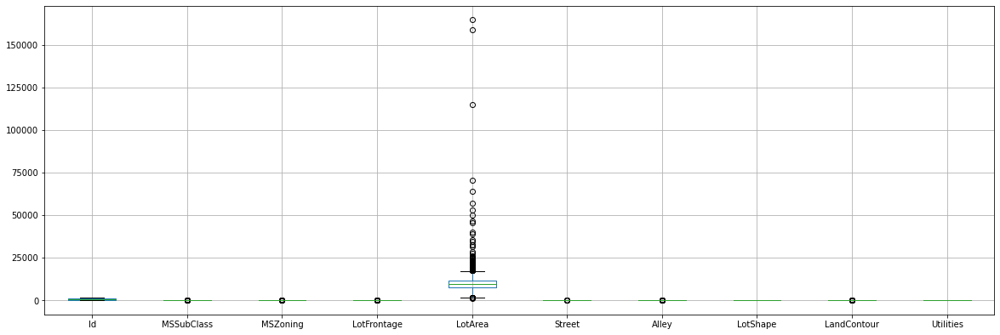

In [104]:
#checking the outliers
df.iloc[:,0:10].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

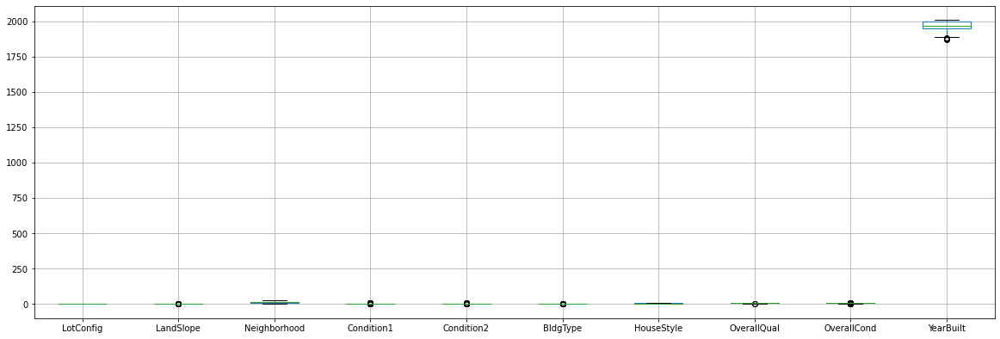

In [105]:
#checking the outliers
df.iloc[:,10:20].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

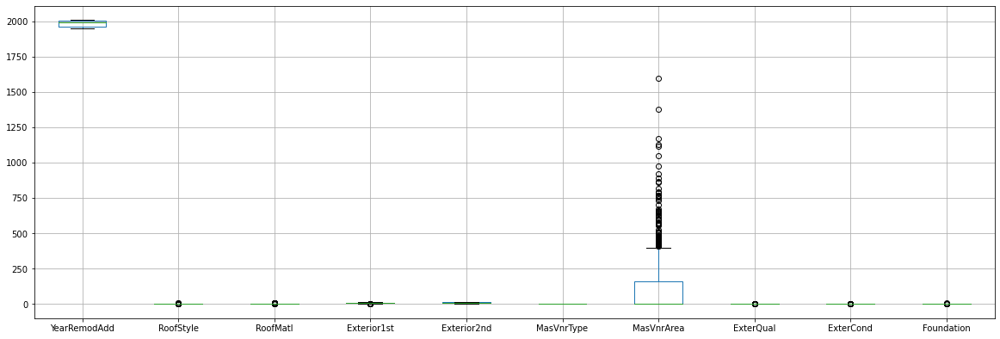

In [106]:
#checking the outliers
df.iloc[:,20:30].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

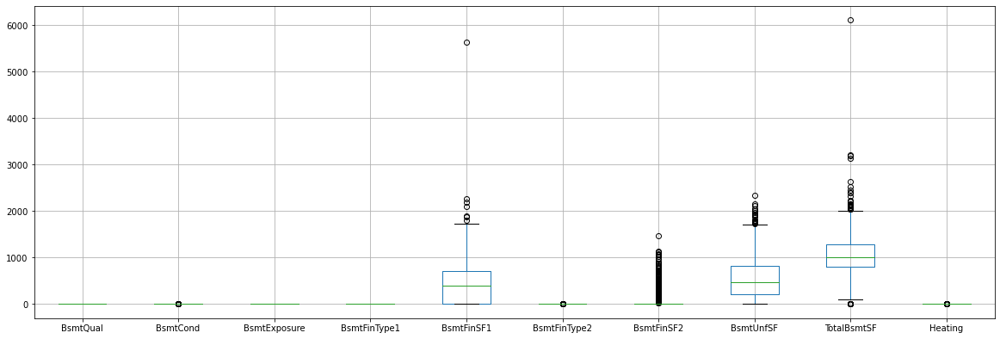

In [107]:
#checking the outliers
df.iloc[:,30:40].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

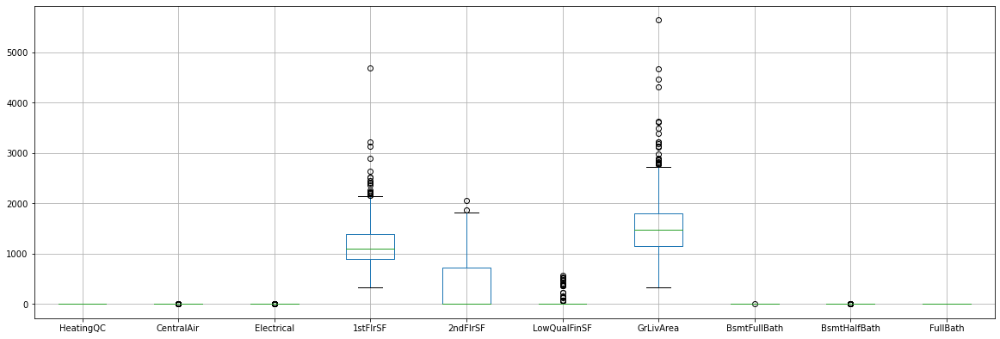

In [108]:
#checking the outliers
df.iloc[:,40:50].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

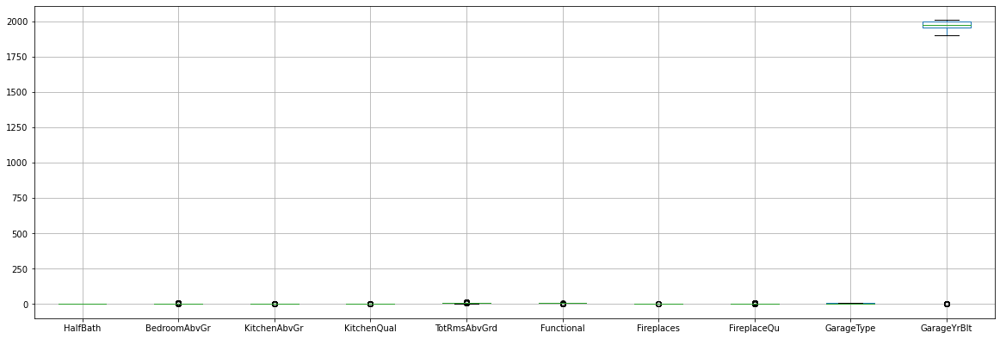

In [109]:
#checking the outliers
df.iloc[:,50:60].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

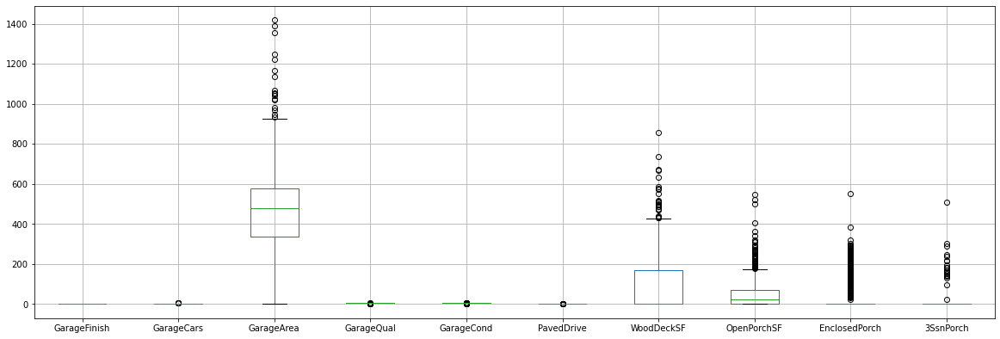

In [110]:
#checking the outliers
df.iloc[:,60:70].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

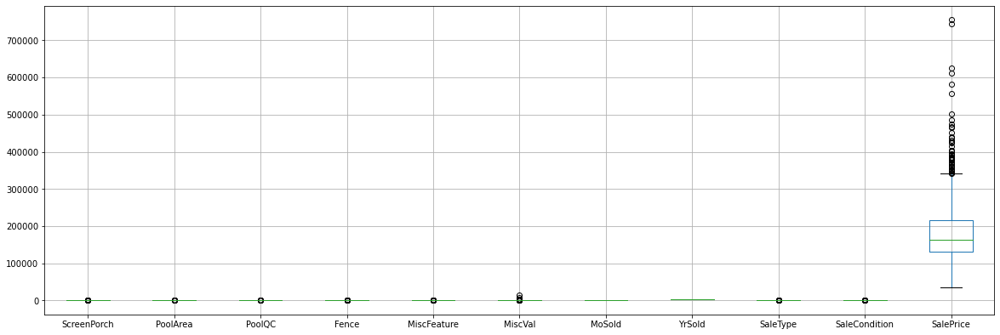

In [111]:
#checking the outliers
df.iloc[:,70:82].boxplot(figsize=[20,8])
plt.subplots_adjust(bottom=0.25)
plt.show()

- As We can observe that the outliers are present in the columns which have some kind of area present. So it might be possible that area can be more of that house because there are some outliers present in the SalePrice column. These outliers in the SalePrice is because of the more area in different aspects. 

In [117]:
df.skew()

Id                0.026526
MSSubClass        1.422019
MSZoning         -1.796785
LotFrontage       2.710383
LotArea          10.659285
Street          -17.021969
Alley            -0.203241
LotShape         -0.603775
LandContour      -3.125982
Utilities         0.000000
LotConfig        -1.118821
LandSlope         4.812568
Neighborhood      0.043735
Condition1        3.008289
Condition2       11.514458
BldgType          2.318657
HouseStyle        0.285680
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
RoofStyle         1.498560
RoofMatl          7.577352
Exterior1st      -0.612816
Exterior2nd      -0.592349
MasVnrType       -0.104609
MasVnrArea        2.834658
ExterQual        -1.810843
ExterCond        -2.516219
Foundation       -0.002761
BsmtQual         -0.487530
BsmtCond         -2.816444
BsmtExposure     -0.960565
BsmtFinType1      0.100811
BsmtFinSF1        1.871606
BsmtFinType2     -3.144813
BsmtFinSF2        4.365829
B

In [118]:
df_new=power_transform(df)

df_new=pd.DataFrame(df_new,columns=df.columns)

In [119]:
df_new.skew()

Id               -0.268486
MSSubClass        0.064007
MSZoning          0.233113
LotFrontage       0.161368
LotArea           0.032509
Street          -17.021969
Alley             0.692155
LotShape         -0.594207
LandContour      -2.592303
Utilities         0.000000
LotConfig        -1.030401
LandSlope         3.954345
Neighborhood     -0.146541
Condition1        0.225468
Condition2        0.537277
BldgType          1.857194
HouseStyle       -0.080331
OverallQual       0.021658
OverallCond       0.048063
YearBuilt        -0.126641
YearRemodAdd     -0.225131
RoofStyle        -0.292233
RoofMatl         -6.314987
Exterior1st      -0.338023
Exterior2nd      -0.352793
MasVnrType       -0.016203
MasVnrArea        0.416370
ExterQual        -0.605112
ExterCond        -2.270791
Foundation        0.004296
BsmtQual         -0.254027
BsmtCond         -2.518509
BsmtExposure     -0.791990
BsmtFinType1     -0.159718
BsmtFinSF1       -0.404528
BsmtFinType2     -2.103840
BsmtFinSF2        2.394737
B

In [120]:
skew=('Street','LandContour','LandSlope','RoofMatl','ExterCond','BsmtCond','BsmtFinType2','BsmtFinSF2','Heating','CentralAir','Electrical','LowQualFinSF','BsmtHalfBath','KitchenAbvGr','Functional','GarageYrBlt','GarageQual','GarageCond','PavedDrive','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','PoolQC','MiscFeature','MiscVal','SaleType')

for i in skew:
    if df_new.skew().loc[i]>0.5:
        df_new[i]=np.log1p(df_new[i])

In [121]:
df_new.skew()

Id               -0.268486
MSSubClass        0.064007
MSZoning          0.233113
LotFrontage       0.161368
LotArea           0.032509
Street          -17.021969
Alley             0.692155
LotShape         -0.594207
LandContour      -2.592303
Utilities         0.000000
LotConfig        -1.030401
LandSlope         3.954345
Neighborhood     -0.146541
Condition1        0.225468
Condition2        0.537277
BldgType          1.857194
HouseStyle       -0.080331
OverallQual       0.021658
OverallCond       0.048063
YearBuilt        -0.126641
YearRemodAdd     -0.225131
RoofStyle        -0.292233
RoofMatl         -6.314987
Exterior1st      -0.338023
Exterior2nd      -0.352793
MasVnrType       -0.016203
MasVnrArea        0.416370
ExterQual        -0.605112
ExterCond        -2.270791
Foundation        0.004296
BsmtQual         -0.254027
BsmtCond         -2.518509
BsmtExposure     -0.791990
BsmtFinType1     -0.159718
BsmtFinSF1       -0.404528
BsmtFinType2     -2.103840
BsmtFinSF2        2.394734
B

In [122]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
dfa=scaler.fit_transform(df_new)
print(dfa)

[[-1.54496771  1.37043472 -0.16245555 ...  0.40906852  0.02973497
  -0.67135266]
 [ 0.46194084 -1.16799937 -0.16245555 ...  0.40906852  0.02973497
   1.18117384]
 [ 0.25422089  0.4900471  -0.16245555 ...  0.40906852  0.02973497
   1.19758737]
 ...
 [-1.30033656  1.70079775 -0.16245555 ...  0.40906852  0.02973497
  -0.2940318 ]
 [-1.97567978  0.69655685 -2.92646435 ...  0.40906852  0.02973497
  -3.71339385]
 [-0.14748082  0.4900471  -0.16245555 ...  0.40906852  0.02973497
   0.23510859]]


In [123]:
dfb=pd.DataFrame(dfa,columns=df.columns)

In [124]:
dfb

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,-1.544968,1.370435,-0.162456,0.093658,-1.213954,0.058621,-0.004343,-1.366794,0.341434,0.0,0.617281,-0.238775,0.198357,0.053284,0.003800,2.310950,-0.463401,-0.052799,-0.496528,0.026859,-0.613054,-0.388056,-0.088315,-0.326182,-0.209982,0.383932,-0.822734,0.778521,0.377961,-0.558722,-0.646069,0.349221,0.711936,-1.601294,-0.112649,0.404371,-0.363019,0.903777,0.099335,-0.092972,1.231264,0.267506,0.302595,-0.458345,-0.871745,-0.141730,-1.236502,-0.837006,-0.238775,0.802290,-0.782707,-1.083459,-0.169259,0.944965,-0.984125,0.276573,0.777879,1.576273,-0.775187,0.231550,-0.014371,0.259753,-0.113082,0.335216,0.317552,0.300947,-0.959773,1.409990,-0.411302,-0.138554,-0.297551,-0.077648,0.077648,0.503226,-0.128107,-0.193133,-1.719437,-0.604825,0.409069,0.029735,-0.671353
1,0.461941,-1.167999,-0.162456,1.117135,1.100521,0.058621,-0.004343,-1.366794,0.341434,0.0,0.617281,4.188040,0.037086,0.053284,0.003800,-0.436548,-0.463401,1.345826,0.407009,-0.185817,-0.854247,-5.058580,5.396201,1.159356,1.119374,0.383932,-0.822734,-1.124906,-2.646123,0.852373,1.039048,-2.877335,-1.377577,-1.601294,0.394677,-1.935452,2.755327,1.027313,2.374300,-0.092972,-0.968376,0.267506,0.302595,2.122554,-0.871745,-0.141730,1.295050,1.176812,-0.238775,0.802290,-0.782707,1.356214,-0.169259,-0.687929,0.943901,0.276573,0.777879,1.576273,-0.775187,0.195214,0.990955,0.259753,0.678810,0.335216,0.317552,0.300947,0.781991,1.414498,-0.411302,-0.138554,3.360775,-0.077648,0.077648,0.503226,-0.128107,-0.193133,1.320612,-0.604825,0.409069,0.029735,1.181174
2,0.254221,0.490047,-0.162456,0.998803,0.158048,0.058621,-0.004343,-1.366794,0.341434,0.0,-1.482445,-0.238775,0.512775,0.053284,0.003800,-0.436548,1.021519,0.656375,-0.496528,0.836680,0.495717,-0.388056,-0.088315,-0.646692,-0.781046,0.383932,-0.822734,-1.124906,0.377961,0.852373,-0.646069,0.349221,-1.678422,-0.389478,0.925416,0.404371,-0.363019,-0.504500,0.185571,-0.092972,-0.968376,0.267506,0.302595,0.058641,1.176207,-0.141730,1.003880,1.176812,-0.238775,0.802290,1.268421,0.151784,-0.169259,0.944965,0.943901,0.276573,0.777879,1.576273,-0.775187,0.336336,0.990955,0.259753,-0.045422,0.335216,0.317552,0.300947,1.043999,1.198911,-0.411302,-0.138554,-0.297551,-0.077648,0.077648,0.503226,-0.128107,-0.193133,-0.076750,-0.604825,0.409069,0.029735,1.197587
3,-1.610857,-1.167999,-0.162456,1.495566,0.496002,0.058621,-0.004343,-1.366794,0.341434,0.0,0.617281,-0.238775,0.356843,0.053284,0.003800,-0.436548,-0.463401,-0.052799,0.407009,0.063582,-0.569998,1.737139,-0.088315,-0.326182,-0.209982,-1.237353,1.382984,0.778521,0.377961,-0.558722,-0.646069,0.349221,0.711936,-0.922364,0.797133,0.404371,-0.363019,1.160517,1.674462,-0.092972,-0.968376,0.267506,0.302595,1.574554,-0.871745,-0.141730,0.739356,-0.837006,-0.238775,0.802290,-0.782707,0.151784,-0.169259,0.944965,0.375729,0.276573,0.777879,1.576273,-0.775187,0.231550,-0.014371,0.259753,0.356726,0.335216,0.317552,0.300947,-0.959773,1.169545,-0.411302,-0.138554,-0.297551,-0.077648,0.077648,-1.935972,-0.128107,-0.193133,-2.209015,1.649742,-2.769993,0.029735,0.326442
4,-0.635571,-1.167999,-0.162456,0.093658,1.196626,0.058621,-0.004343,-1.366794,0.341434,0.0,-1

### Model Building

In [125]:
#splitting the dataset into independent and target variables in x and y respectively

x=dfb.drop('SalePrice', axis=1)
y=df['SalePrice']

In [126]:
x

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,-1.544968,1.370435,-0.162456,0.093658,-1.213954,0.058621,-0.004343,-1.366794,0.341434,0.0,0.617281,-0.238775,0.198357,0.053284,0.003800,2.310950,-0.463401,-0.052799,-0.496528,0.026859,-0.613054,-0.388056,-0.088315,-0.326182,-0.209982,0.383932,-0.822734,0.778521,0.377961,-0.558722,-0.646069,0.349221,0.711936,-1.601294,-0.112649,0.404371,-0.363019,0.903777,0.099335,-0.092972,1.231264,0.267506,0.302595,-0.458345,-0.871745,-0.141730,-1.236502,-0.837006,-0.238775,0.802290,-0.782707,-1.083459,-0.169259,0.944965,-0.984125,0.276573,0.777879,1.576273,-0.775187,0.231550,-0.014371,0.259753,-0.113082,0.335216,0.317552,0.300947,-0.959773,1.409990,-0.411302,-0.138554,-0.297551,-0.077648,0.077648,0.503226,-0.128107,-0.193133,-1.719437,-0.604825,0.409069,0.029735
1,0.461941,-1.167999,-0.162456,1.117135,1.100521,0.058621,-0.004343,-1.366794,0.341434,0.0,0.617281,4.188040,0.037086,0.053284,0.003800,-0.436548,-0.463401,1.345826,0.407009,-0.185817,-0.854247,-5.058580,5.396201,1.159356,1.119374,0.383932,-0.822734,-1.124906,-2.646123,0.852373,1.039048,-2.877335,-1.377577,-1.601294,0.394677,-1.935452,2.755327,1.027313,2.374300,-0.092972,-0.968376,0.267506,0.302595,2.122554,-0.871745,-0.141730,1.295050,1.176812,-0.238775,0.802290,-0.782707,1.356214,-0.169259,-0.687929,0.943901,0.276573,0.777879,1.576273,-0.775187,0.195214,0.990955,0.259753,0.678810,0.335216,0.317552,0.300947,0.781991,1.414498,-0.411302,-0.138554,3.360775,-0.077648,0.077648,0.503226,-0.128107,-0.193133,1.320612,-0.604825,0.409069,0.029735
2,0.254221,0.490047,-0.162456,0.998803,0.158048,0.058621,-0.004343,-1.366794,0.341434,0.0,-1.482445,-0.238775,0.512775,0.053284,0.003800,-0.436548,1.021519,0.656375,-0.496528,0.836680,0.495717,-0.388056,-0.088315,-0.646692,-0.781046,0.383932,-0.822734,-1.124906,0.377961,0.852373,-0.646069,0.349221,-1.678422,-0.389478,0.925416,0.404371,-0.363019,-0.504500,0.185571,-0.092972,-0.968376,0.267506,0.302595,0.058641,1.176207,-0.141730,1.003880,1.176812,-0.238775,0.802290,1.268421,0.151784,-0.169259,0.944965,0.943901,0.276573,0.777879,1.576273,-0.775187,0.336336,0.990955,0.259753,-0.045422,0.335216,0.317552,0.300947,1.043999,1.198911,-0.411302,-0.138554,-0.297551,-0.077648,0.077648,0.503226,-0.128107,-0.193133,-0.076750,-0.604825,0.409069,0.029735
3,-1.610857,-1.167999,-0.162456,1.495566,0.496002,0.058621,-0.004343,-1.366794,0.341434,0.0,0.617281,-0.238775,0.356843,0.053284,0.003800,-0.436548,-0.463401,-0.052799,0.407009,0.063582,-0.569998,1.737139,-0.088315,-0.326182,-0.209982,-1.237353,1.382984,0.778521,0.377961,-0.558722,-0.646069,0.349221,0.711936,-0.922364,0.797133,0.404371,-0.363019,1.160517,1.674462,-0.092972,-0.968376,0.267506,0.302595,1.574554,-0.871745,-0.141730,0.739356,-0.837006,-0.238775,0.802290,-0.782707,0.151784,-0.169259,0.944965,0.375729,0.276573,0.777879,1.576273,-0.775187,0.231550,-0.014371,0.259753,0.356726,0.335216,0.317552,0.300947,-0.959773,1.169545,-0.411302,-0.138554,-0.297551,-0.077648,0.077648,-1.935972,-0.128107,-0.193133,-2.209015,1.649742,-2.769993,0.029735
4,-0.635571,-1.167999,-0.162456,0.093658,1.196626,0.058621,-0.004343,-1.366794,0.341434,0.0,-1.025661,-0.238775,0.356843,0.053284,0.003800,-0

In [127]:
y=pd.DataFrame(y, columns=['SalePrice'])

In [128]:
y

,SalePrice
0,128000
1,268000
2,269790
3,190000
4,215000
5,219210
6,121500
7,155000
8,140000
9,118500


In [129]:
#checking the best random state
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print(f"At random state {i}, the training accuracy is:- {r2_score(y_train,pred_train)}")
    print(f"At random state {i}, the testing accuracy is:- {r2_score(y_test,pred_test)}")
    print("\n")

At random state 0, the training accuracy is:- 0.840086381808938
At random state 0, the testing accuracy is:- 0.799975063846194


At random state 1, the training accuracy is:- 0.8435002187418276
At random state 1, the testing accuracy is:- 0.7847524326974937


At random state 2, the training accuracy is:- 0.8510229115741316
At random state 2, the testing accuracy is:- 0.7485641701308212


At random state 3, the training accuracy is:- 0.8335133570305513
At random state 3, the testing accuracy is:- 0.8406680913464994


At random state 4, the training accuracy is:- 0.844954069013507
At random state 4, the testing accuracy is:- 0.7374826584096759


At random state 5, the training accuracy is:- 0.8541046534449747
At random state 5, the testing accuracy is:- 0.6675210681959851


At random state 6, the training accuracy is:- 0.8356385156130534
At random state 6, the testing accuracy is:- 0.8347954718122153


At random state 7, the training accuracy is:- 0.8530072652088737
At random state 7, th

At random state 62, the testing accuracy is:- 0.8512128061814058


At random state 63, the training accuracy is:- 0.8449839129619173
At random state 63, the testing accuracy is:- 0.7871327313173491


At random state 64, the training accuracy is:- 0.8517549684637149
At random state 64, the testing accuracy is:- 0.7558836573170058


At random state 65, the training accuracy is:- 0.8440299035672364
At random state 65, the testing accuracy is:- 0.7128920319694891


At random state 66, the training accuracy is:- 0.8463973144317594
At random state 66, the testing accuracy is:- 0.7585129795890908


At random state 67, the training accuracy is:- 0.8546522479055141
At random state 67, the testing accuracy is:- 0.755033187230645


At random state 68, the training accuracy is:- 0.8362286104416687
At random state 68, the testing accuracy is:- 0.8287633523377138


At random state 69, the training accuracy is:- 0.8553218130272103
At random state 69, the testing accuracy is:- 0.7215199637211196


At 

- From the above stats, at random state 94 the testing accuracy and training accuracy is hightest.

- Testing the best Random State in different algorithms

In [130]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=94)

In [131]:
model=[LinearRegression(),SVR(),RandomForestRegressor(),DecisionTreeRegressor(),KernelRidge()]

In [132]:
for n in model:
    n.fit(x_train,y_train)
    n.score(x_train,y_train)
    predm=n.predict(x_test)
    print('r2 score of',n,'is:')
    print(r2_score(y_test,predm))
    print(mean_squared_error(y_test,predm))
    print(mean_absolute_error(y_test,predm))
    print('\n')

r2 score of LinearRegression() is:
0.8693868826939174
819911652.543308
21408.17185210275


r2 score of SVR() is:
-0.13460233692170642
7122360266.962656
58857.16736407322


r2 score of RandomForestRegressor() is:
0.8822641661005588
739075707.9155915
18094.333846153848


r2 score of DecisionTreeRegressor() is:
0.7900012853976556
1318247329.7692308
26340.760683760684


r2 score of KernelRidge() is:
-5.674402334043373
41897937667.47166
199456.94074797857




- Now checking cross validation score to check whether our models are overfitted or underfitted.

In [133]:
scrli=cross_val_score(LinearRegression(),x,y, cv=5)
print('cross validation score of linearregression: ',scrli.mean())

cross validation score of linearregression:  0.7500827354611314


In [134]:
scrrf=cross_val_score(RandomForestRegressor(),x,y, cv=5)
print('cross validation score of RandomForestregression: ',scrrf.mean())

cross validation score of RandomForestregression:  0.838723560787912


In [135]:
scrdtr=cross_val_score(DecisionTreeRegressor(),x,y, cv=5)
print('cross validation score of DecisionTreeregression: ',scrdtr.mean())

cross validation score of DecisionTreeregression:  0.6835411308803752


In [136]:
scrsvr=cross_val_score(SVR(),x,y, cv=5)
print('cross validation score of SVR: ',scrsvr.mean())

cross validation score of SVR:  -0.06179430565211521


In [137]:
scrkr=cross_val_score(KernelRidge(),x,y, cv=5)
print('cross validation score of KernelRidge: ',scrkr.mean())

cross validation score of KernelRidge:  -5.929591051825183


- Minimum difference in r2_score and cross validation score is for RandomForestRegressor(4.4). So it is our best model

### Hyperparameter Tunning

- Doing GridSearchCV for getting best parameters

In [138]:
param_grid = {  'bootstrap': [True], 'max_depth': [5, 10, None], 'max_features': ['auto', 'log2'], 'n_estimators': [5, 6, 7, 8, 9, 10, 11, 12, 13, 15],}

In [139]:
GCV=GridSearchCV(RandomForestRegressor(), param_grid,  cv = 5,)

In [140]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'bootstrap': [True], 'max_depth': [5, 10, None],
                         'max_features': ['auto', 'log2'],
                         'n_estimators': [5, 6, 7, 8, 9, 10, 11, 12, 13, 15]})

In [141]:
#getting the best parameters found by GridSearchCV
GCV.best_params_

{'bootstrap': True,
 'max_depth': None,
 'max_features': 'auto',
 'n_estimators': 11}

In [142]:
GCV_pred=GCV.best_estimator_.predict(x_test)

In [143]:
r2_score(y_test,GCV_pred,)

0.8466537554556532

In [144]:
joblib.dump(GCV.best_estimator_,'HousePricePrediction.obj')

['HousePricePrediction.obj']